# **Unsupervised Learning - K-Means Clustering and Hierarchical Clustering - The Heritage Foundation's Economic Freedom Index Analysis 2019 - By David Salako.**


## **Background and Context**

Created in 1995 by the Heritage Foundation, The Index of Economic Freedom is a ranking created to measure the economic freedom in the countries of the world. 

Now, in its 25th edition, The Economic Freedom Index is poised to help readers track over two decades of the advancement in economic freedom, prosperity, and opportunity and promote these ideas in their homes, schools, and communities. 

The Index covers 12 freedoms, from property rights to financial freedom, in 186 countries.




## **Objective:**

As a data scientist, I have been tasked to (1) analyze the data, (2) use clustering algorithms to identify different groups of countries based on economic freedom, and (3) list the insights from the analysis.


##**Data Dictionary & Description:**

The data comprises factors indicating economic freedom. The list of variables in the data is given below. All these features are self-explanatory and more details can be found in the data source listed below.

    * CountryID
    * Country Name
    * WEBNAME
    * Region
    * World Rank
    * Region Rank
    * 2019 Score
    * Property Rights
    * Judical Effectiveness
    * Government Integrity
    * Tax Burden
    * Gov't Spending
    * Fiscal Health
    * Business Freedom
    * Labor Freedom
    * Monetary Freedom
    * Trade Freedom
    * Investment Freedom
    * Financial Freedom
    * Tariff Rate (%)
    * Income Tax Rate (%)
    * Corporate Tax Rate (%)
    * Tax Burden % of GDP
    * Gov't Expenditure % of GDP
    * Country
    * Population (Millions)
    * GDP (Billions, PPP)
    * GDP Growth Rate (%)
    * 5 Year GDP Growth Rate (%)
    * GDP per Capita (PPP)
    * Unemployment (%)
    * Inflation (%)
    * FDI Inflow (Millions)
    * Public Debt (% of GDP)

##**Data Source**

This dataset belongs to The Heritage Foundation and is freely available to download on their website (https://www.heritage.org/index/ranking).

The Index of Economic Freedom considers every component equally important in achieving the positive benefits of economic freedom. 

Each freedom is weighted equally in determining country scores. 

Countries considering economic reforms may find significant opportunities for improving economic performance in those factors in which they score the lowest. 

These factors may indicate significant binding constraints on economic growth and prosperity. 


## Importing the necessary libraries.

In [1]:
!pip install yellowbrick

In [2]:
# this will help in making the Python code more structured automatically (good coding practice)
# %load_ext nb_black

# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})

%matplotlib inline

import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler
from scipy.stats import zscore

# to compute distances
from scipy.spatial.distance import cdist, pdist

# to perform k-means clustering and compute silhouette scores
from sklearn.model_selection  import train_test_split
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet
from scipy.spatial.distance import pdist

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# to perform PCA
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)



In [3]:
# loading the dataset
# EFIndexData_Orig is a dataframe created from csv file
# index_col is setting the dataframe's index to "Country" Column

EFIndexData_Orig = pd.read_csv('economic_freedom_index_2019_data.csv',index_col = 'Country',encoding='ISO-8859-1')


In [4]:
EFIndexData = EFIndexData_Orig.copy()

In [5]:
EFIndexData.shape

(186, 33)

The dataset has 33 columns and 186 rows of data representing 186 countries.

In [6]:
# viewing a random sample of the dataset
EFIndexData.sample(n=50, random_state=1)

,CountryID,Country Name,WEBNAME,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
Country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Benin,17,Benin,Benin,Sub-Saharan Africa,127.0,21.0,55.3,37.2,32.8,28.1,69.3,83.4,27.9,62.4,53.8,86.4,61.8,70.0,50.0,11.6,45.0,30.0,11.9,23.5,11.1,$25.3,5.6,5.0,"$2,277",2.5,0.1,184.4,54.6
Vanuatu,178,Vanuatu,Vanuatu,Asia-Pacific,116.0,26.0,56.4,65.9,36.4,51.9,97.3,54.1,15.3,52.4,58.8,75.0,64.4,65.0,40.0,7.8,0.0,0.0,16.3,39.1,0.3,$0.8,4.2,2.4,"$2,739",5.2,3.1,24.7,48.4
Guatemala,65,Guatemala,Guatemala,Americas,77.0,16.0,62.6,40.3,32.3,26.4,79.2,95.6,96.2,53.6,48.7,77.0,82.2,70.0,50.0,1.4,31.0,31.0,12.6,12.1,16.9,$137.8,2.8,3.6,"$8,145",2.7,4.4,"1,146.7",24.4
Côte d'Ivoire,40,Côte d'Ivoire,CoeDivoire,Sub-Saharan Africa,78.0,5.0,62.4,40.9,47.8,38.1,77.5,83.9,74.3,61.0,52.5,74.2,73.6,75.0,50.0,8.2,36.0,25.0,18.2,23.1,25.0,$96.9,7.8,8.6,"$3,883",2.6,0.8,674.7,46.4
Togo,165,Togo,Togo,Sub-Saharan Africa,158.0,35.0,50.3,35.5,29.6,28.1,67.8,77.0,24.5,50.4,46.7,79.1,69.4,65.0,30.0,10.3,45.0,27.0,21.5,27.7,7.8,$12.9,4.4,5.5,"$1,659",1.8,-0.7,145.6,78.6
Tunisia,168,Tunisia,Tunisia,Middle East and North Africa,125.0,10.0,55.4,49.2,42.7,36.6,74.4,74.4,37.9,76.7,50.3,76.0,71.4,45.0,30.0,9.3,35.0,30.0,20.8,29.2,11.5,$135.4,1.9,1.7,"$11,755",15.4,5.3,879.5,71.3
Liberia,95,Liberia,Liberia,Sub-Saharan Africa,160.0,37.0,49.7,26.7,39.0,24.2,82.7,62.1,69.1,50.6,38.3,68.9,60.1,55.0,20.0,12.4,25.0,25.0,21.8,35.5,4.5,$6.1,2.5,2.1,"$1,354",2.4,12.4,247.8,34.4
Papua New Guinea,128,Papua New Guinea,PapuaNewGuinea,Asia-Pacific,101.0,21.0,58.4,37.4,49.0,37.2,71.8,89.1,75.2,62.2,72.6,70.0,80.9,25.0,30.0,2.0,42.0,30.0,12.5,19.1,8.3,$30.3,2.5,5.8,"$3,675",2.7,5.2,-200.5,32.6
Colombia,35,Colombia,Colombia,Americas,49.0,8.0,67.3,59.2,34.3,33.5,74.3,75.0,79.2,71.4,78.5,75.6,76.0,80.0,70.0,7.0,33.0,33.0,19.9,28.9,49.3,$714.0,1.8,3.2,"$14,485",8.9,4.3,"14,518.0",49.4


The EFIndexData_Orig dataframe contains every country's economic freedom index and its ranking in 2019. It also displays the related economic indices like Property Rights, Judicial Effectiveness, GDP, etc.
The column "2019 Score" is the economic freedom index, which measures the degree of economic freedom in the 186 nations.

In [7]:
EFIndexData.info()

<class 'pandas.core.frame.DataFrame'>
Index: 186 entries, Afghanistan to Zimbabwe
Data columns (total 33 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CountryID                    186 non-null    int64  
 1   Country Name                 186 non-null    object 
 2   WEBNAME                      186 non-null    object 
 3   Region                       186 non-null    object 
 4   World Rank                   180 non-null    float64
 5   Region Rank                  180 non-null    float64
 6   2019 Score                   180 non-null    float64
 7   Property Rights              185 non-null    float64
 8   Judical Effectiveness        185 non-null    float64
 9   Government Integrity         185 non-null    float64
 10  Tax Burden                   180 non-null    float64
 11  Gov't Spending               183 non-null    float64
 12  Fiscal Health                183 non-null    float64
 13  Business F

In [8]:
# Replace the abbrevated column names containing the word "Gov't" with "Government".

EFIndexData.columns=[c.replace("Gov't", "Government") for c in EFIndexData.columns]

In [9]:
# Replace "(%)" in the column names with the string "Percent".

EFIndexData.columns=[c.replace("(%)", "Percent") for c in EFIndexData.columns]

In [10]:
# Replace "%" in the column names with the string "Percent".

EFIndexData.columns=[c.replace("%", "Percent") for c in EFIndexData.columns]

In [11]:
# Replace "(Millions)" in the column names with the string "in Millions".

EFIndexData.columns=[c.replace("(Millions)", "in Millions") for c in EFIndexData.columns]

In [12]:
# Replace "(Billions, PPP)" in the column names with the string "in Billions by PPP in USA Dollars".

EFIndexData.columns=[c.replace("(Billions, PPP)", "in Billions by PPP in USA Dollars") for c in EFIndexData.columns]

In [13]:
# Replace "(Percent of GDP)" in the column names with the string "by Percent of GDP".

EFIndexData.columns=[c.replace("(Percent of GDP)", "by Percent of GDP") for c in EFIndexData.columns]

In [14]:
# Replace "(PPP)" in the column names with the string "by PPP".

EFIndexData.columns=[c.replace("(PPP)", "by PPP") for c in EFIndexData.columns]

In [15]:
EFIndexData.columns=[c.replace("GDP per Capita by PPP", "GDP per Capita by PPP in USA Dollars") for c in EFIndexData.columns]

In [16]:
# Replace the spaces in the column names with "_".

EFIndexData.columns=[c.replace(" ", "_") for c in EFIndexData.columns]

In [17]:
EFIndexData.info()

<class 'pandas.core.frame.DataFrame'>
Index: 186 entries, Afghanistan to Zimbabwe
Data columns (total 33 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   CountryID                               186 non-null    int64  
 1   Country_Name                            186 non-null    object 
 2   WEBNAME                                 186 non-null    object 
 3   Region                                  186 non-null    object 
 4   World_Rank                              180 non-null    float64
 5   Region_Rank                             180 non-null    float64
 6   2019_Score                              180 non-null    float64
 7   Property_Rights                         185 non-null    float64
 8   Judical_Effectiveness                   185 non-null    float64
 9   Government_Integrity                    185 non-null    float64
 10  Tax_Burden                              180 non-null

In [18]:
# Remove the underscore character "_" at the end of the column names.

# EFIndexData['Investment_Freedom_'] = EFIndexData['Investment_Freedom']
# EFIndexData['Government_Expenditure_Percent_of_GDP_'] = EFIndexData['Government_Expenditure_Percent_of_GDP']

EFIndexData.columns=[c.replace("Investment_Freedom_", "Investment_Freedom") for c in EFIndexData.columns]
EFIndexData.columns=[c.replace("Government_Expenditure_Percent_of_GDP_", "Government_Expenditure_Percent_of_GDP") for c in EFIndexData.columns]


In [19]:
EFIndexData.info()

<class 'pandas.core.frame.DataFrame'>
Index: 186 entries, Afghanistan to Zimbabwe
Data columns (total 33 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   CountryID                              186 non-null    int64  
 1   Country_Name                           186 non-null    object 
 2   WEBNAME                                186 non-null    object 
 3   Region                                 186 non-null    object 
 4   World_Rank                             180 non-null    float64
 5   Region_Rank                            180 non-null    float64
 6   2019_Score                             180 non-null    float64
 7   Property_Rights                        185 non-null    float64
 8   Judical_Effectiveness                  185 non-null    float64
 9   Government_Integrity                   185 non-null    float64
 10  Tax_Burden                             180 non-null    float64
 

In [20]:
# EFIndexData = EFIndexData.drop(columns = ['Investment_Freedom_', 'Government_Expenditure_Percent_of_GDP_'])

In [21]:
# we will drop the CountryID column add it adds no value to the analysis

EFIndexData.drop("CountryID", axis=1, inplace=True)

In [22]:
# The Region attribute is a categorical variable data type.

EFIndexData.Region = EFIndexData.Region.astype('category')

In [23]:
EFIndexData.info()

<class 'pandas.core.frame.DataFrame'>
Index: 186 entries, Afghanistan to Zimbabwe
Data columns (total 32 columns):
 #   Column                                 Non-Null Count  Dtype   
---  ------                                 --------------  -----   
 0   Country_Name                           186 non-null    object  
 1   WEBNAME                                186 non-null    object  
 2   Region                                 186 non-null    category
 3   World_Rank                             180 non-null    float64 
 4   Region_Rank                            180 non-null    float64 
 5   2019_Score                             180 non-null    float64 
 6   Property_Rights                        185 non-null    float64 
 7   Judical_Effectiveness                  185 non-null    float64 
 8   Government_Integrity                   185 non-null    float64 
 9   Tax_Burden                             180 non-null    float64 
 10  Government_Spending                    183 non-null 

All 32 of the column names are now nicely formatted with appropriate data types too.

Checking for missing values in the data set.

In [24]:
# Check missing values
def missing_values(df):
    miss_val = df.isnull().sum()
    miss_val_percent = df.isnull().sum() / len(df) * 100
    cols = EFIndexData.columns.values
    sort_ = np.argsort(cols)
    indices = pd.Series(sort_[np.searchsorted(cols,cols,sorter=sort_)],
                       index=cols)
    miss_val_table = pd.concat([indices, miss_val, miss_val_percent],
                               axis=1)
    miss_val_df = miss_val_table.rename(
    columns = {0: "Column Index", 1: "Missing Values", 2: "% Missing"})
    return miss_val_df

In [25]:
missing_values(EFIndexData)

,Column Index,Missing Values,% Missing
Country_Name,0,0,0.000000
WEBNAME,1,0,0.000000
Region,2,0,0.000000
World_Rank,3,6,3.225806
Region_Rank,4,6,3.225806
2019_Score,5,6,3.225806
Property_Rights,6,1,0.537634
Judical_Effectiveness,7,1,0.537634
Government_Integrity,8,1,0.537634
Tax_Burden,9,6,3.225806


In [26]:
na_count = EFIndexData.isnull().sum(axis=1)
na_EFIndexData = na_count[na_count > 0]
pd.concat([EFIndexData.loc[na_EFIndexData.index]['Country_Name'],na_EFIndexData], 
          axis=1).rename(columns={0: "NA Count"})

,Country_Name,NA Count
Country,,
Cuba,Cuba,1
Dominica,Dominica,1
Iraq,Iraq,9
Kiribati,Kiribati,1
"Korea, North","Korea, North",6
Kosovo,Kosovo,1
Libya,Libya,9
Liechtenstein,Liechtenstein,21
Micronesia,Micronesia,2


The 13 countries with missing data are either small nations with low populations (Liechtenstein, Kiribati et al.), isolated (North Korea),  or those experiencing long term conflict (Yemen, Syria, Somalia et al.); none of these charecteristics contribute substantially to a model being designed around global level economic freedom index analysis. The data collected from the isolated and unstable countries are often estimates that may not be relied upon. They are outliers.
Missing data for these territories are attributes such as "2019 Score", "World Rank", "Region Rank", "FDI_Inflow_in_Millions", and "Unemployment Percent". These are not values that can be credibly imputed.

<br/>

*Population_in_Millions*, *GDP_in_Billions_by_PPP_in_USA_Dollars*, *GDP_per_Capita_by_PPP_in_USA_Dollars*, *Unemployment_Percent*, and *FDI_Inflow_in_Millions* are of *object* type in the data but are actually numeric in nature.

In [27]:
# checking for duplicate values
EFIndexData.duplicated().sum()

0

There are no duplicate values in this data set.

In [28]:
l_df = len(EFIndexData)
# Remove missing data
EFIndexData = EFIndexData.dropna()

In [29]:
# Checking missing values
EFIndexData.isna().sum()

Country_Name                             0
WEBNAME                                  0
Region                                   0
World_Rank                               0
Region_Rank                              0
2019_Score                               0
Property_Rights                          0
Judical_Effectiveness                    0
Government_Integrity                     0
Tax_Burden                               0
Government_Spending                      0
Fiscal_Health                            0
Business_Freedom                         0
Labor_Freedom                            0
Monetary_Freedom                         0
Trade_Freedom                            0
Investment_Freedom                       0
Financial_Freedom                        0
Tariff_Rate_Percent                      0
Income_Tax_Rate_Percent                  0
Corporate_Tax_Rate_Percent               0
Tax_Burden_Percent_of_GDP                0
Government_Expenditure_Percent_of_GDP    0
Population_

No missing values remaining in the data set.

In [30]:
print("%s Percent of Original Data Remaining." 
    %round(len(EFIndexData) / l_df * 100, 2))

93.01 Percent of Original Data Remaining.


In [31]:
print("%s Countries Remaining in the Data Set." 
    %len(EFIndexData))

173 Countries Remaining in the Data Set.


In [32]:
EFIndexData.describe()

,World_Rank,Region_Rank,2019_Score,Property_Rights,Judical_Effectiveness,Government_Integrity,Tax_Burden,Government_Spending,Fiscal_Health,Business_Freedom,Labor_Freedom,Monetary_Freedom,Trade_Freedom,Investment_Freedom,Financial_Freedom,Tariff_Rate_Percent,Income_Tax_Rate_Percent,Corporate_Tax_Rate_Percent,Tax_Burden_Percent_of_GDP,Government_Expenditure_Percent_of_GDP,GDP_Growth_Rate_Percent,5_Year_GDP_Growth_Rate_Percent,Inflation_Percent,Public_Debt_by_Percent_of_GDP
count,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000
mean,89.046243,20.219653,61.349133,53.561850,46.045087,42.284393,77.704046,66.019075,66.811561,64.722543,60.051445,75.682659,75.022543,58.583815,49.653179,5.623699,28.604046,23.916763,22.045665,32.023121,3.290751,3.171676,10.869942,56.667052
std,51.636567,12.623265,10.290731,19.229243,17.651070,19.925058,11.786874,20.957233,30.813333,14.770800,13.778284,9.501612,10.825901,21.408001,18.921378,4.408220,13.235103,8.878332,10.151558,10.387187,2.748959,2.467099,82.555305,33.854417
min,1.000000,1.000000,25.900000,7.600000,12.300000,7.900000,42.000000,0.900000,0.000000,17.700000,20.000000,0.000000,45.000000,0.000000,10.000000,0.000000,0.000000,0.000000,1.600000,10.600000,-14.000000,-7.800000,-0.900000,0.000000
25%,44.000000,9.000000,54.600000,37.400000,32.300000,28.100000,71.000000,54.100000,42.500000,55.800000,51.100000,72.400000,67.400000,45.000000,40.000000,2.000000,20.000000,20.000000,14.000000,23.600000,2.000000,2.000000,1.300000,35.200000
50%,90.000000,19.000000,60.800000,52.400000,44.000000,36.400000,78.600000,70.000000,80.300000,65.800000,60.100000,77.800000,76.600000,60.000000,50.000000,4.200000,30.000000,25.000000,20.700000,31.600000,3.200000,3.100000,2.800000,50.400000
75%,133.000000,30.000000,68.100000,66.000000,56.000000,50.500000,85.400000,83.300000,90.100000,75.200000,69.200000,81.800000,84.700000,75.000000,60.000000,8.700000,35.000000,30.000000,29.500000,39.100000,4.800000,4.500000,5.500000,70.200000
max,179.000000,47.000000,90.200000,97.400000,92.400000,96.700000,99.800000,96.600000,100.000000,96.400000,91.000000,88.000000,95.000000,95.000000,90.000000,18.600000,60.000000,50.000000,47.000000,57.500000,10.900000,9.900000,1087.500000,236.400000


In [33]:
# Drop columns by index to be excluded from the model: CountryID and WEBNAME.

# EFIndexData = EFIndexData.drop(EFIndexData.columns[[0,2]], 
#               axis=1)

# Print remaining columns

# EFIndexData.columns

In [34]:
EFIndexData.info()

<class 'pandas.core.frame.DataFrame'>
Index: 173 entries, Afghanistan to Zimbabwe
Data columns (total 32 columns):
 #   Column                                 Non-Null Count  Dtype   
---  ------                                 --------------  -----   
 0   Country_Name                           173 non-null    object  
 1   WEBNAME                                173 non-null    object  
 2   Region                                 173 non-null    category
 3   World_Rank                             173 non-null    float64 
 4   Region_Rank                            173 non-null    float64 
 5   2019_Score                             173 non-null    float64 
 6   Property_Rights                        173 non-null    float64 
 7   Judical_Effectiveness                  173 non-null    float64 
 8   Government_Integrity                   173 non-null    float64 
 9   Tax_Burden                             173 non-null    float64 
 10  Government_Spending                    173 non-null 

In [35]:
EFIndexData.head(180)

,Country_Name,WEBNAME,Region,World_Rank,Region_Rank,2019_Score,Property_Rights,Judical_Effectiveness,Government_Integrity,Tax_Burden,Government_Spending,Fiscal_Health,Business_Freedom,Labor_Freedom,Monetary_Freedom,Trade_Freedom,Investment_Freedom,Financial_Freedom,Tariff_Rate_Percent,Income_Tax_Rate_Percent,Corporate_Tax_Rate_Percent,Tax_Burden_Percent_of_GDP,Government_Expenditure_Percent_of_GDP,Population_in_Millions,GDP_in_Billions_by_PPP_in_USA_Dollars,GDP_Growth_Rate_Percent,5_Year_GDP_Growth_Rate_Percent,GDP_per_Capita_by_PPP_in_USA_Dollars,Unemployment_Percent,Inflation_Percent,FDI_Inflow_in_Millions,Public_Debt_by_Percent_of_GDP
Country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,Afghanistan,Afghanistan,Asia-Pacific,152.0,39.0,51.5,19.6,29.6,25.2,91.7,80.3,99.3,49.2,60.4,76.7,66.0,10.0,10.0,7.0,20.0,20.0,5.0,25.6,35.5,$69.6,2.5,2.9,"$1,958",8.8,5.0,53.9,7.3
Albania,Albania,Albania,Europe,52.0,27.0,66.5,54.8,30.6,40.4,86.3,73.9,80.6,69.3,52.7,81.5,87.8,70.0,70.0,1.1,23.0,15.0,24.9,29.5,2.9,$36.0,3.9,2.5,"$12,507",13.9,2.0,"1,119.1",71.2
Algeria,Algeria,Algeria,Middle East and North Africa,171.0,14.0,46.2,31.6,36.2,28.9,76.4,48.7,18.7,61.6,49.9,74.9,67.4,30.0,30.0,8.8,35.0,23.0,24.5,41.4,41.5,$632.9,2.0,3.1,"$15,237",10.0,5.6,"1,203.0",25.8
Angola,Angola,Angola,Sub-Saharan Africa,156.0,33.0,50.6,35.9,26.6,20.5,83.9,80.7,58.2,55.7,58.8,55.4,61.2,30.0,40.0,9.4,17.0,30.0,20.6,25.3,28.2,$190.3,0.7,2.9,"$6,753",8.2,31.7,"-2,254.5",65.3
Argentina,Argentina,Argentina,Americas,148.0,26.0,52.2,47.8,44.5,33.5,69.3,49.5,33.0,56.4,46.9,60.2,70.0,55.0,60.0,7.5,35.0,30.0,30.8,41.0,44.1,$920.2,2.9,0.7,"$20,876",8.7,25.7,"11,857.0",52.6
Armenia,Armenia,Armenia,Europe,47.0,24.0,67.7,57.2,46.3,38.6,84.7,79.0,53.0,78.3,71.4,77.8,80.8,75.0,70.0,2.1,26.0,20.0,21.3,26.4,3.0,$28.3,7.5,3.6,"$9,456",18.2,0.9,245.7,53.5
Australia,Australia,Australia,Asia-Pacific,5.0,4.0,80.9,79.1,86.5,79.9,62.8,60.1,86.2,88.3,84.1,86.6,87.6,80.0,90.0,1.2,45.0,30.0,28.2,36.5,24.8,"$1,246.5",2.3,2.4,"$50,334",5.6,2.0,"46,368.0",41.6
Austria,Austria,Austria,Europe,31.0,16.0,72.0,84.2,71.3,77.4,50.5,24.5,85.5,74.9,68.7,81.5,86.0,90.0,70.0,2.0,50.0,25.0,42.7,50.2,8.8,$439.6,2.9,1.3,"$49,869",5.5,2.2,"9,629.6",78.8
Azerbaijan,Azerbaijan,Azerbaijan,Asia-Pacific,60.0,13.0,65.4,59.1,53.1,44.7,87.5,59.5,89.4,69.5,63.9,63.0,74.6,60.0,60.0,5.2,25.0,20.0,15.0,36.7,9.8,$171.8,0.1,1.2,"$17,492",5.0,13.0,"2,867.0",54.7


## Data Preprocessing.

### Processing columns.
* Let us process the following columns in order to extract numerical values from them:

  *   Population_in_Millions
  *   GDP_in_Billions_by_PPP_in_USA_Dollars
  *   GDP_per_Capita_by_PPP_in_USA_Dollars
  *   Unemployment_Percent
  *   FDI_Inflow_in_Millions

**1. `Population_in_Millions`**

- Remove the leading and trailing spaces from the column values.

In [36]:
col = "Population_in_Millions"

EFIndexData[col] = EFIndexData[col].str.strip()

**2. `GDP_in_Billions_by_PPP_in_USA_Dollars and GDP_per_Capita_by_PPP_in_USA_Dollars`**
- Remove the $ symbol and the commas within the numeric strings.
- Replace them with blank strings.
- Additionally, remove the leading and trailing spaces.




In [37]:
EFIndexData['GDP_in_Billions_by_PPP_in_USA_Dollars'] = EFIndexData['GDP_in_Billions_by_PPP_in_USA_Dollars'].replace({'\$':''}, regex = True)
EFIndexData['GDP_in_Billions_by_PPP_in_USA_Dollars'] = EFIndexData['GDP_in_Billions_by_PPP_in_USA_Dollars'].replace({'\,':''}, regex = True)

EFIndexData['GDP_per_Capita_by_PPP_in_USA_Dollars'] = EFIndexData['GDP_per_Capita_by_PPP_in_USA_Dollars'].replace({'\$':''}, regex = True)
EFIndexData['GDP_per_Capita_by_PPP_in_USA_Dollars'] = EFIndexData['GDP_per_Capita_by_PPP_in_USA_Dollars'].replace({'\,':''}, regex = True)

col1 = "GDP_in_Billions_by_PPP_in_USA_Dollars"
EFIndexData[col1] = EFIndexData[col1].str.strip()

col2 = "GDP_per_Capita_by_PPP_in_USA_Dollars"
EFIndexData[col2] = EFIndexData[col2].str.strip()

In [38]:
EFIndexData.head()

,Country_Name,WEBNAME,Region,World_Rank,Region_Rank,2019_Score,Property_Rights,Judical_Effectiveness,Government_Integrity,Tax_Burden,Government_Spending,Fiscal_Health,Business_Freedom,Labor_Freedom,Monetary_Freedom,Trade_Freedom,Investment_Freedom,Financial_Freedom,Tariff_Rate_Percent,Income_Tax_Rate_Percent,Corporate_Tax_Rate_Percent,Tax_Burden_Percent_of_GDP,Government_Expenditure_Percent_of_GDP,Population_in_Millions,GDP_in_Billions_by_PPP_in_USA_Dollars,GDP_Growth_Rate_Percent,5_Year_GDP_Growth_Rate_Percent,GDP_per_Capita_by_PPP_in_USA_Dollars,Unemployment_Percent,Inflation_Percent,FDI_Inflow_in_Millions,Public_Debt_by_Percent_of_GDP
Country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,Afghanistan,Afghanistan,Asia-Pacific,152.0,39.0,51.5,19.6,29.6,25.2,91.7,80.3,99.3,49.2,60.4,76.7,66.0,10.0,10.0,7.0,20.0,20.0,5.0,25.6,35.5,69.6,2.5,2.9,1958,8.8,5.0,53.9,7.3
Albania,Albania,Albania,Europe,52.0,27.0,66.5,54.8,30.6,40.4,86.3,73.9,80.6,69.3,52.7,81.5,87.8,70.0,70.0,1.1,23.0,15.0,24.9,29.5,2.9,36.0,3.9,2.5,12507,13.9,2.0,"1,119.1",71.2
Algeria,Algeria,Algeria,Middle East and North Africa,171.0,14.0,46.2,31.6,36.2,28.9,76.4,48.7,18.7,61.6,49.9,74.9,67.4,30.0,30.0,8.8,35.0,23.0,24.5,41.4,41.5,632.9,2.0,3.1,15237,10.0,5.6,"1,203.0",25.8
Angola,Angola,Angola,Sub-Saharan Africa,156.0,33.0,50.6,35.9,26.6,20.5,83.9,80.7,58.2,55.7,58.8,55.4,61.2,30.0,40.0,9.4,17.0,30.0,20.6,25.3,28.2,190.3,0.7,2.9,6753,8.2,31.7,"-2,254.5",65.3
Argentina,Argentina,Argentina,Americas,148.0,26.0,52.2,47.8,44.5,33.5,69.3,49.5,33.0,56.4,46.9,60.2,70.0,55.0,60.0,7.5,35.0,30.0,30.8,41.0,44.1,920.2,2.9,0.7,20876,8.7,25.7,"11,857.0",52.6


**3. `FDI_Inflow_in_Millions`**

- The *FDI_Inflow_in_Millions* column values had commas in between.
- Replace the commas with a blank string.
- We will also remove the leading and trailing spaces.

In [39]:
col4 = "FDI_Inflow_in_Millions"

EFIndexData[col4] = EFIndexData[col4].str.replace(",", "").str.strip()
EFIndexData.head()

,Country_Name,WEBNAME,Region,World_Rank,Region_Rank,2019_Score,Property_Rights,Judical_Effectiveness,Government_Integrity,Tax_Burden,Government_Spending,Fiscal_Health,Business_Freedom,Labor_Freedom,Monetary_Freedom,Trade_Freedom,Investment_Freedom,Financial_Freedom,Tariff_Rate_Percent,Income_Tax_Rate_Percent,Corporate_Tax_Rate_Percent,Tax_Burden_Percent_of_GDP,Government_Expenditure_Percent_of_GDP,Population_in_Millions,GDP_in_Billions_by_PPP_in_USA_Dollars,GDP_Growth_Rate_Percent,5_Year_GDP_Growth_Rate_Percent,GDP_per_Capita_by_PPP_in_USA_Dollars,Unemployment_Percent,Inflation_Percent,FDI_Inflow_in_Millions,Public_Debt_by_Percent_of_GDP
Country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,Afghanistan,Afghanistan,Asia-Pacific,152.0,39.0,51.5,19.6,29.6,25.2,91.7,80.3,99.3,49.2,60.4,76.7,66.0,10.0,10.0,7.0,20.0,20.0,5.0,25.6,35.5,69.6,2.5,2.9,1958,8.8,5.0,53.9,7.3
Albania,Albania,Albania,Europe,52.0,27.0,66.5,54.8,30.6,40.4,86.3,73.9,80.6,69.3,52.7,81.5,87.8,70.0,70.0,1.1,23.0,15.0,24.9,29.5,2.9,36.0,3.9,2.5,12507,13.9,2.0,1119.1,71.2
Algeria,Algeria,Algeria,Middle East and North Africa,171.0,14.0,46.2,31.6,36.2,28.9,76.4,48.7,18.7,61.6,49.9,74.9,67.4,30.0,30.0,8.8,35.0,23.0,24.5,41.4,41.5,632.9,2.0,3.1,15237,10.0,5.6,1203.0,25.8
Angola,Angola,Angola,Sub-Saharan Africa,156.0,33.0,50.6,35.9,26.6,20.5,83.9,80.7,58.2,55.7,58.8,55.4,61.2,30.0,40.0,9.4,17.0,30.0,20.6,25.3,28.2,190.3,0.7,2.9,6753,8.2,31.7,-2254.5,65.3
Argentina,Argentina,Argentina,Americas,148.0,26.0,52.2,47.8,44.5,33.5,69.3,49.5,33.0,56.4,46.9,60.2,70.0,55.0,60.0,7.5,35.0,30.0,30.8,41.0,44.1,920.2,2.9,0.7,20876,8.7,25.7,11857.0,52.6


In [40]:
# changing FDI_Inflow_in_Millions column datatype from Python object to a numeric float.

EFIndexData[col4] = EFIndexData[col4].astype(float)

In [41]:
EFIndexData.info()

<class 'pandas.core.frame.DataFrame'>
Index: 173 entries, Afghanistan to Zimbabwe
Data columns (total 32 columns):
 #   Column                                 Non-Null Count  Dtype   
---  ------                                 --------------  -----   
 0   Country_Name                           173 non-null    object  
 1   WEBNAME                                173 non-null    object  
 2   Region                                 173 non-null    category
 3   World_Rank                             173 non-null    float64 
 4   Region_Rank                            173 non-null    float64 
 5   2019_Score                             173 non-null    float64 
 6   Property_Rights                        173 non-null    float64 
 7   Judical_Effectiveness                  173 non-null    float64 
 8   Government_Integrity                   173 non-null    float64 
 9   Tax_Burden                             173 non-null    float64 
 10  Government_Spending                    173 non-null 

In [42]:
# Changing Population_in_Millions column datatype from Python object to a numeric float.

EFIndexData.Population_in_Millions = EFIndexData.Population_in_Millions.astype(float)

In [43]:
# Changing GDP_per_Capita_by_PPP_in_USA_Dollars column datatype from Python object to a numeric float.

EFIndexData.GDP_per_Capita_by_PPP_in_USA_Dollars = EFIndexData.GDP_per_Capita_by_PPP_in_USA_Dollars.astype(float)

In [44]:
# Changing Unemployment_Percent column datatype from Python object to a numeric float.

EFIndexData.Unemployment_Percent = EFIndexData.Unemployment_Percent.astype(float)

In [45]:
# Changing GDP_in_Billions_by_PPP_in_USA_Dollars column datatype from Python object to a numeric float.

EFIndexData.GDP_in_Billions_by_PPP_in_USA_Dollars = EFIndexData.GDP_in_Billions_by_PPP_in_USA_Dollars.astype(float)

In [46]:
EFIndexData.info()

<class 'pandas.core.frame.DataFrame'>
Index: 173 entries, Afghanistan to Zimbabwe
Data columns (total 32 columns):
 #   Column                                 Non-Null Count  Dtype   
---  ------                                 --------------  -----   
 0   Country_Name                           173 non-null    object  
 1   WEBNAME                                173 non-null    object  
 2   Region                                 173 non-null    category
 3   World_Rank                             173 non-null    float64 
 4   Region_Rank                            173 non-null    float64 
 5   2019_Score                             173 non-null    float64 
 6   Property_Rights                        173 non-null    float64 
 7   Judical_Effectiveness                  173 non-null    float64 
 8   Government_Integrity                   173 non-null    float64 
 9   Tax_Burden                             173 non-null    float64 
 10  Government_Spending                    173 non-null 

In [47]:
# viewing a random sample of the dataset

EFIndexData.sample(n=50, random_state=1)

,Country_Name,WEBNAME,Region,World_Rank,Region_Rank,2019_Score,Property_Rights,Judical_Effectiveness,Government_Integrity,Tax_Burden,Government_Spending,Fiscal_Health,Business_Freedom,Labor_Freedom,Monetary_Freedom,Trade_Freedom,Investment_Freedom,Financial_Freedom,Tariff_Rate_Percent,Income_Tax_Rate_Percent,Corporate_Tax_Rate_Percent,Tax_Burden_Percent_of_GDP,Government_Expenditure_Percent_of_GDP,Population_in_Millions,GDP_in_Billions_by_PPP_in_USA_Dollars,GDP_Growth_Rate_Percent,5_Year_GDP_Growth_Rate_Percent,GDP_per_Capita_by_PPP_in_USA_Dollars,Unemployment_Percent,Inflation_Percent,FDI_Inflow_in_Millions,Public_Debt_by_Percent_of_GDP
Country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Luxembourg,Luxembourg,Luxembourg,Europe,17.0,9.0,75.9,83.0,72.4,85.8,65.4,46.6,98.9,68.8,45.9,82.6,86.0,95.0,80.0,2.0,42.0,18.0,37.1,42.2,0.6,62.7,3.5,3.8,106374.0,5.5,2.1,6622.7,23.0
Nicaragua,Nicaragua,Nicaragua,Americas,107.0,21.0,57.7,33.4,18.7,20.3,76.9,79.1,93.9,56.0,55.8,72.7,76.0,60.0,50.0,2.0,30.0,30.0,22.6,26.4,6.2,36.4,4.9,4.8,5849.0,4.4,3.9,896.6,33.6
Bosnia and Herzegovina,Bosnia and Herzegovina,BosniaHerzegovina,Europe,83.0,37.0,61.9,40.2,37.9,30.2,84.3,46.1,96.6,49.7,67.0,83.1,82.6,65.0,60.0,1.2,10.0,10.0,37.0,42.4,3.5,44.6,2.7,2.5,12724.0,25.6,1.3,425.2,41.0
Honduras,Honduras,Honduras,Americas,93.0,20.0,60.2,43.4,31.0,25.3,82.8,78.2,95.9,56.9,32.0,73.0,79.4,65.0,60.0,2.8,25.0,25.0,21.6,27.0,8.3,46.2,4.8,3.6,5562.0,4.5,3.9,1185.7,43.9
Eswatini,Eswatini,Eswatini,Sub-Saharan Africa,132.0,23.0,54.7,41.7,42.9,35.0,74.8,65.6,18.3,59.2,67.5,73.7,87.6,50.0,40.0,1.2,33.0,28.0,25.5,33.9,1.1,11.3,0.2,2.0,9884.0,26.4,6.3,-136.8,29.2
Saudi Arabia,Saudi Arabia,SaudiArabia,Middle East and North Africa,91.0,9.0,60.7,55.0,62.7,49.8,99.8,57.5,19.4,72.3,63.3,78.1,76.0,45.0,50.0,4.5,2.5,2.5,3.4,37.6,32.4,1773.6,-0.7,2.3,54777.0,5.5,-0.9,1421.0,17.3
Portugal,Portugal,Portugal,Europe,62.0,30.0,65.3,71.5,64.3,59.5,59.9,35.6,69.8,79.7,44.3,83.0,86.0,70.0,60.0,2.0,48.0,23.0,34.4,46.3,10.3,313.4,2.7,1.2,30417.0,8.9,1.6,6945.6,125.6
Belgium,Belgium,Belgium,Europe,48.0,25.0,67.3,81.3,61.6,72.5,47.1,15.2,73.4,78.1,61.0,76.1,86.0,85.0,70.0,2.0,50.0,29.0,44.2,53.2,11.4,528.5,1.7,1.2,46553.0,7.4,2.2,740.4,103.2
Mongolia,Mongolia,Mongolia,Asia-Pacific,126.0,29.0,55.4,48.2,23.8,29.8,88.5,63.1,6.2,66.0,75.0,77.8,75.8,50.0,60.0,4.6,10.0,25.0,20.7,35.1,3.1,39.7,5.1,5.7,12979.0,7.0,4.6,1494.4,91.4


For this analysis, I will be keeping the remaining columns and attributes in the data set at this point even though there will most likely be high multi-collinearity due to the nature of how the "2019_Score" Economic Freedom Index is derived. As this is not a regression analysis excercise, the collinearity between some of the independent variables is not a major concern. Additionally, some of the variables are close in nature to one another such as the GDP, Taxation, and Governance but all are individually important nuggets of information that the Heritage Foundation put together.

The zeros that appear in variables such as "Income_Tax_Rate_Percent", "Corporate_Tax_Rate_Percent", "GDP_growth_Rate_Percent", "Fiscal_Health", "Investment_Fredom" etc. will remain as they are valid values for the countries in question.

## Exploratory Data Analysis (EDA).

In [48]:
# A statistical summary of the data.

EFIndexData.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Country_Name,173,173,Canada,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WEBNAME,173,173,Canada,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Region,173,5,Sub-Saharan Africa,46,NaN,NaN,NaN,NaN,NaN,NaN,NaN
World_Rank,173,NaN,NaN,NaN,89.0462,51.6366,1,44,90,133,179
Region_Rank,173,NaN,NaN,NaN,20.2197,12.6233,1,9,19,30,47
2019_Score,173,NaN,NaN,NaN,61.3491,10.2907,25.9,54.6,60.8,68.1,90.2
Property_Rights,173,NaN,NaN,NaN,53.5618,19.2292,7.6,37.4,52.4,66,97.4
Judical_Effectiveness,173,NaN,NaN,NaN,46.0451,17.6511,12.3,32.3,44,56,92.4
Government_Integrity,173,NaN,NaN,NaN,42.2844,19.9251,7.9,28.1,36.4,50.5,96.7
Tax_Burden,173,NaN,NaN,NaN,77.704,11.7869,42,71,78.6,85.4,99.8


**Observations**

- The 2019 score varies from 25.9 to 90.2.
- There are 5 regions.
- The income tax rate varies from 0-60%.


### Univariate Analysis.

In [49]:
# function to plot a boxplot and a histogram along the same scale.

def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

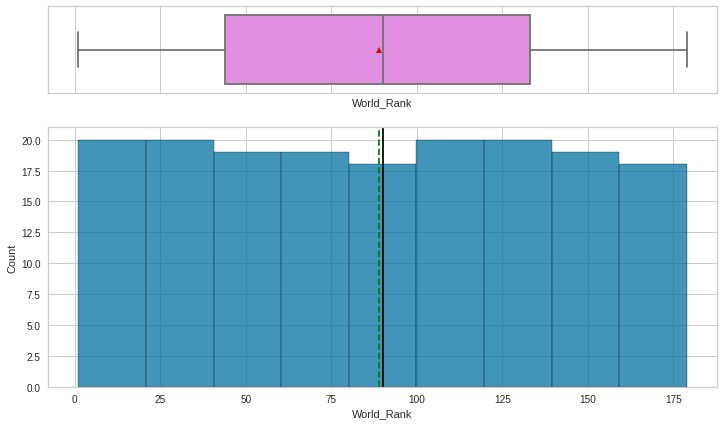

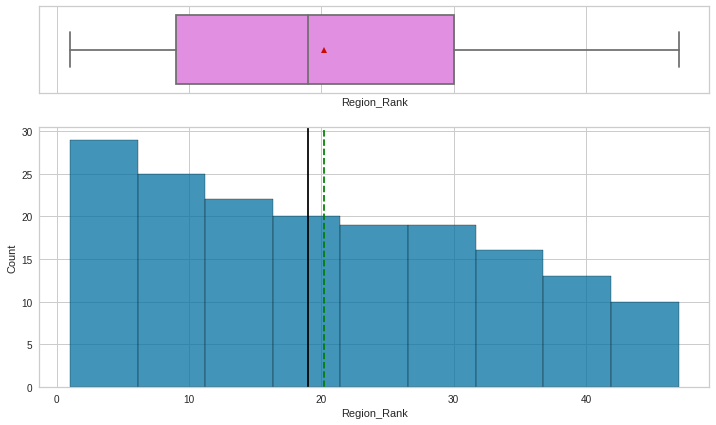

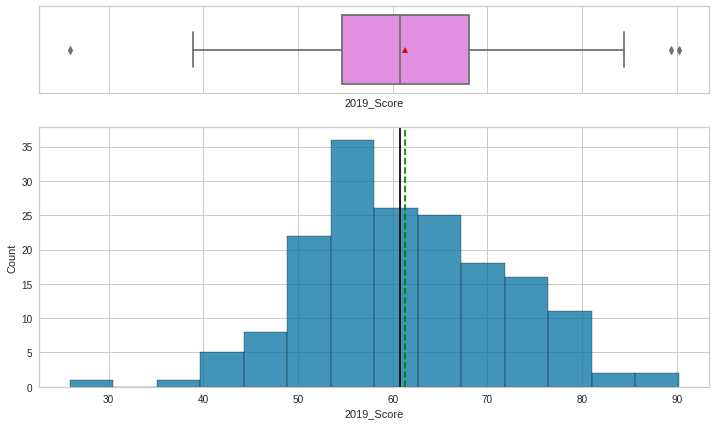

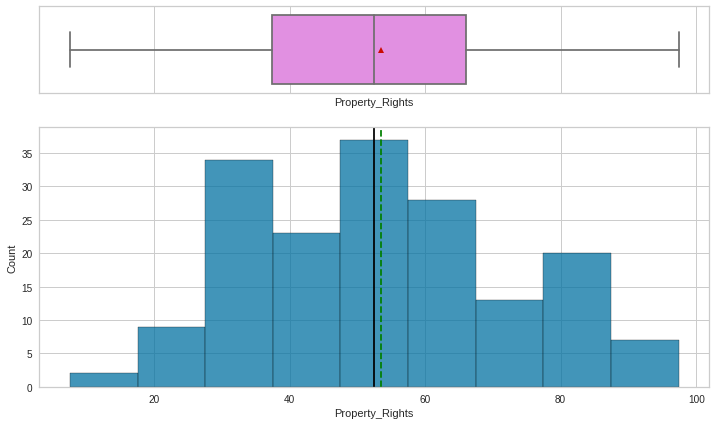

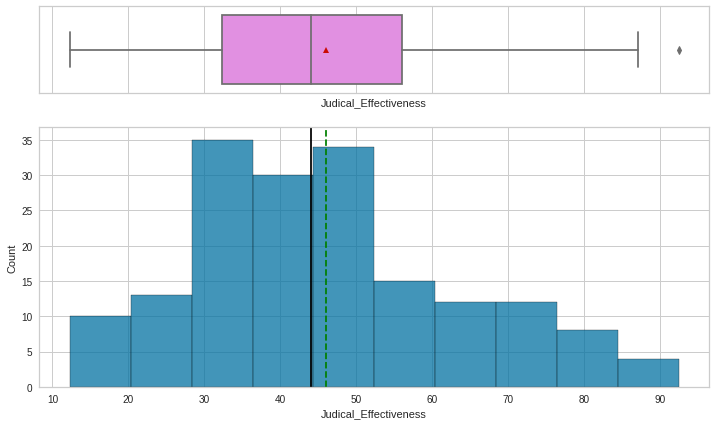

...

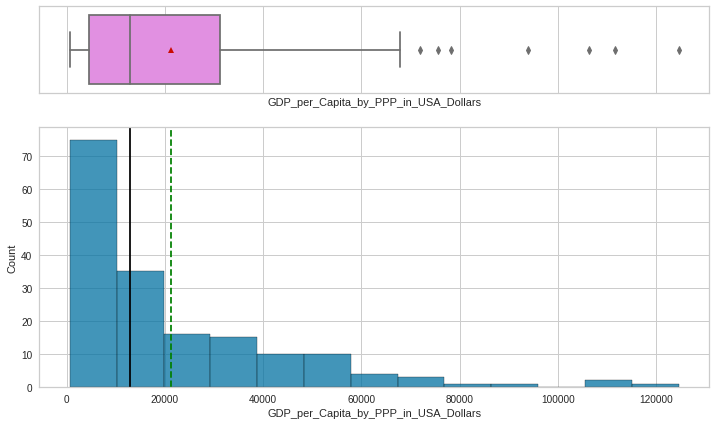

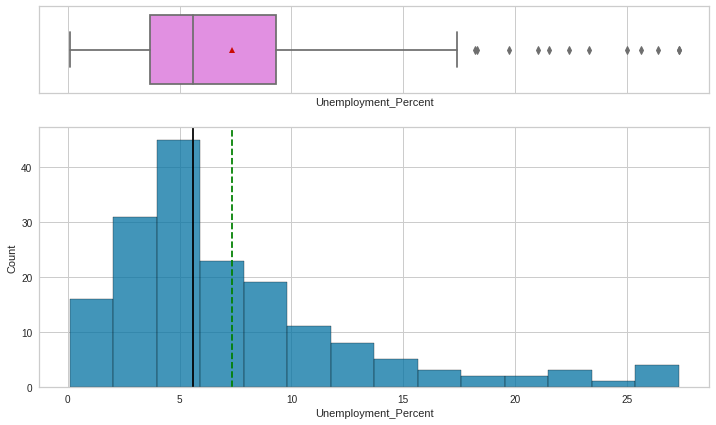

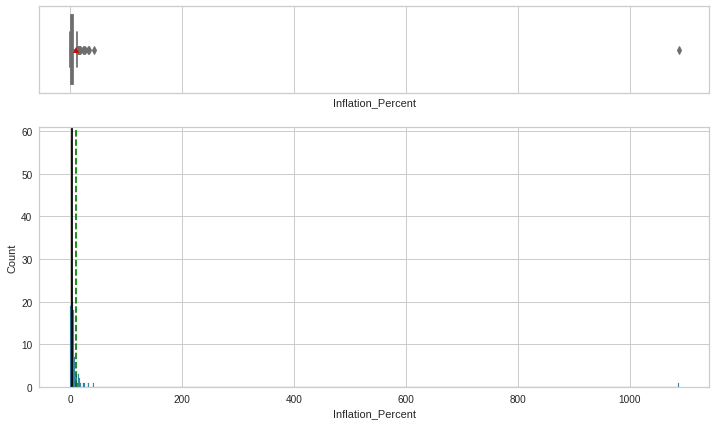

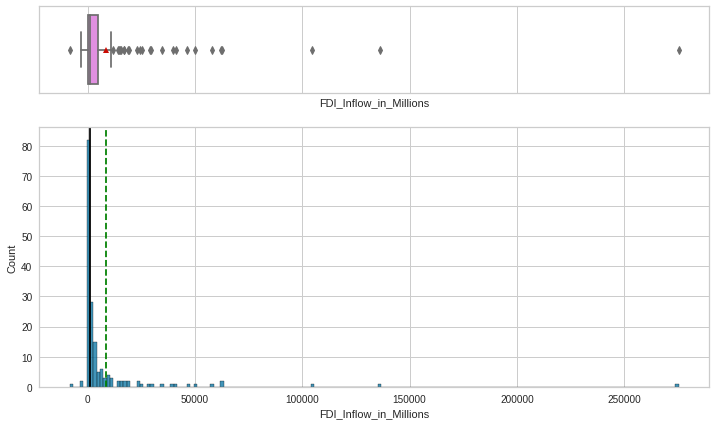

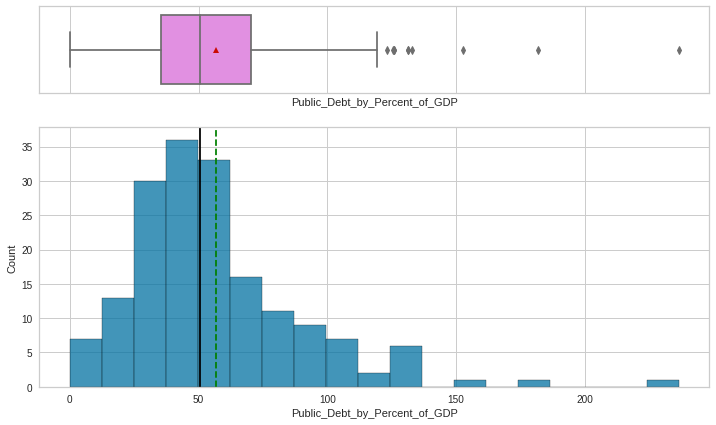

In [50]:
# selecting numerical columns

num_col = EFIndexData.select_dtypes(include=np.number).columns.tolist()

for item in num_col:
    histogram_boxplot(EFIndexData, item)

**Observations**


* 2019_Score: normal distribution with a few outliers with low scores such as Venezuela and very high scores such as Singapore and Hong Kong. Mean and median scores are close to 60.

* Property_Rights: normally distributed.

* Judicial_Effectiveness: normally distribute with one high outlier being Singapore.

* Government_Integrity: right skewed with low outlier Venuezela.

* Tax_Burden: left skewed data with high taxation countries such as Denmark, France, Belgium, and Sweden as outliers. A high number means low tax burden and a low number indicates a high tax burden.

* Government_Spending: left skewed data set with outliers Timor-Leste, France, and Finland.

* Fiscal_Health: left skewed attribute.

* Business_Freedom: normally distributed with outlier Eritrea.

* Labor_Freedom: normally distributed with outliers such as Turkmenistan.

* Monetary_Freedom: left skewed variable with low outliers such as Venuezela and the Democratic republic of the Congo.

* Trade_Freedom: slight left skew to this attribute.

* Financial_Freedom: normal distribution.

* Tarrif_Rate_Percent: right skewed column.

* GDP_Growth_Rate_Percent: normal distribution with a slight left skew; negative outliers sich as Venezuela and the Democratic Republic of the Congo and high positive oulier Ethiopia.

* 5_Year_GDP_Growth_Rate_Percent: normal distribution with a slight left skew and outlier Venezuela.

* Inflation_Percent: most hover below zero, zero, and above zero with high outliers nations such as Venezuela, Angloa, the Democratic Republic of the Congo and Sudan.

* Public_Dept_by_Percent_of_GDP: near normal distribution with slight right skew and high outliers such as Greece, Japan, and Lebanon.

* Investment_Freedom: normally distributed with a slight left skew.

* Income_Tax_Rate_Percent: the rate varies between 0% to 60%, with a median of 30%.

* Population is heavily right-skewed.

The rest of the fields are either normal distributions or categorical non-numeric variables.

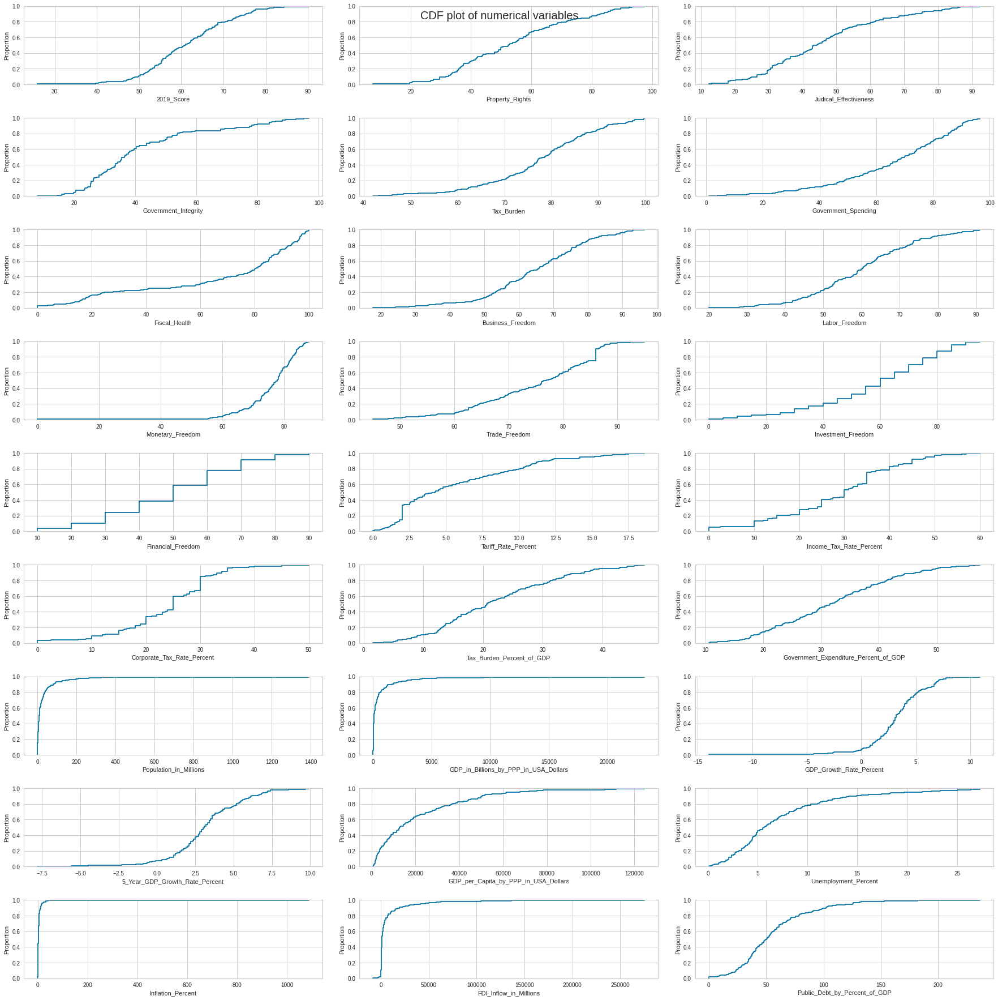

In [51]:
cols_list = EFIndexData.select_dtypes(include=np.number).columns.to_list()
cols_list.remove("World_Rank")
cols_list.remove("Region_Rank")


fig, axes = plt.subplots(9, 3, figsize=(25, 25))
fig.suptitle("CDF plot of numerical variables", fontsize=20)
counter = 0
for ii in range(9):
     sns.ecdfplot(ax=axes[ii][0], x=EFIndexData[cols_list[counter]])
     counter = counter + 1

     sns.ecdfplot(ax=axes[ii][1], x=EFIndexData[cols_list[counter]])
     counter = counter + 1

     sns.ecdfplot(ax=axes[ii][2], x=EFIndexData[cols_list[counter]])
     counter = counter + 1

fig.tight_layout(pad=2.0)

**Observations**

The curves illustrate similar information to the earlier boxplots and histograms above.

- 50% of countries have a 2019 score of less than 60.
- 80% of countries have properties right score less than 70.
- 80% of countries have a Judicial Effectiveness score of less than 60. 
- 80% of countries have Govt integrity less than 50. 
- 20% of countries have a tax burden of less than 70.
- 40% of countries have govt spending less than 63.
- 40% of countries have fiscal health less than 70.
- 40% of countries have Business freedom less than 60.
- 60% of countries have labor freedom less than 63.
- 20% of countries have monetary freedom less than 70 with 80% having above 70.
- 60% of countries have trade freedom less than 80.
- 80% of countries have a Tariff Rate of less than 10%.
- 80% of countries have an income tax rate of less than 40%.
- 80% of countries have a corporate tax rate of less than 30%.
- 80% of countries have a Tax burden of less than 33% of their GDP.
- GDP_Growth_Rate_Percent, just under 10% of countries have a zero or negative growth rate.



In [52]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

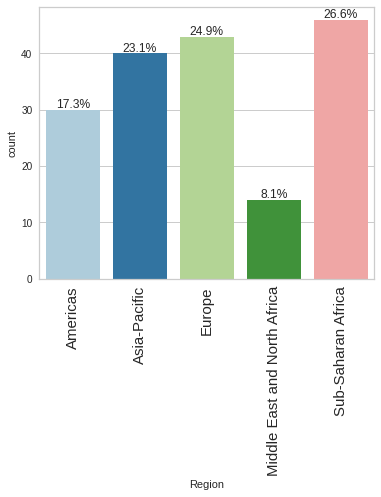

In [53]:
# Let's explore Region further
labeled_barplot(EFIndexData, "Region", perc=True)

**Observations**

* The Sub-Saharan Africa region has the largest number of countries at 46 (26.6%) in this data set which is in line with the African continent being the second largest in terms of size and having the highest number of nations at 54/55.

* Europe and Asia-Pacific have the next two largest groups of nations.

* The Americas and Middle East and North Africa have the least amount of countries in terms of count.

In [54]:
EFIndexData.groupby('Region').size()

Region
Americas                        30
Asia-Pacific                    40
Europe                          43
Middle East and North Africa    14
Sub-Saharan Africa              46
dtype: int64

**Observations**

According to Times World Atlas,there are:
* 35 countries in the Americas,
* 48 countries in Asia-Pacific, 
* 44 countries in Europe,
* 17 countries in Middle East and North Africa, and 
* 48 countries in Sub-Saharan Africa. 

Apart from Asia-Pacific, all the other regions include more than 90% of their countries.

### Bivariate Analysis

**Checking for correlations.**

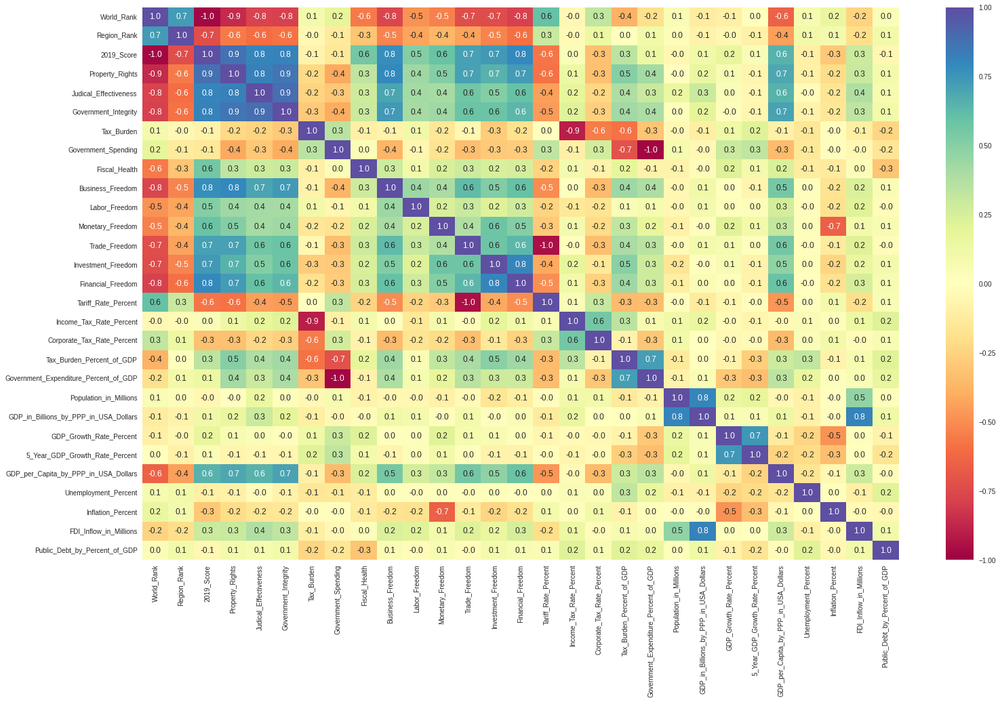

In [55]:
plt.figure(figsize=(25, 15))
sns.heatmap(EFIndexData[num_col].corr(), annot=True, vmin=-1, vmax=1, fmt=".1f", cmap="Spectral")
plt.show()

**Observations**

As alluded to earlier in this analysis there are several correlated variables in this data set which is by design and most are obvious too. Some examples of highly correlated columns are:

* Tax_Burden and Income_Tax_Rate (-0.90)
* Property_Rights and Business_Freedom (0.80)
* Property_Rights and Investment_Freedom (0.66)
* Property_Rights and Financial_Freedom (0.73)
* Property_Rights and Government_Integrity (0.87)
* Property_Rights and Judicial_Effectiveness (0.83)
* Judicial_Effectiveness and Business_Freedom (0.70)
* Judicial_Effectiveness and Government_Integrity (0.89)
* Government_Integrity and Business_Freedom (0.74)
* Government_Integrity and Property_Rights (0.87)
* Government_Spending and Tax_Burden_Percent_of_GDP (-0.71)
* Monetary_Freedom and Inflation_Percent (-0.65)
* Trade_Freedom and Tarrif_Rate_Percent (-0.95)
* Population_in_Millions and GDP_in_Billions_By_PPP_in_USA_Dollars (0.8)
* Monetary_Freedom and Inflation_Percent (-0.7)
* FDI-Inflow_in_Millions and GDP_in_Billions_by_PPP_in_USA_Dollars (0.8)




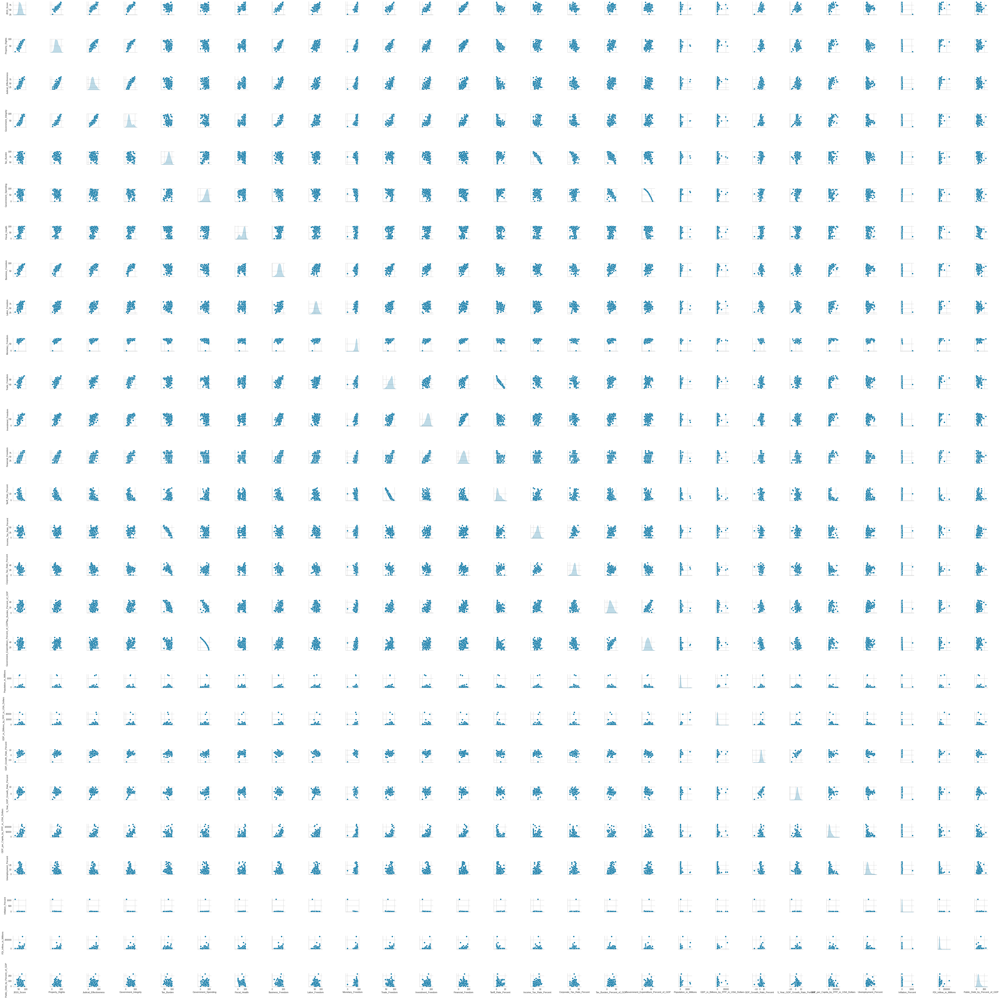

In [56]:
sns.pairplot(data=EFIndexData[cols_list], diag_kind="kde")
plt.show()

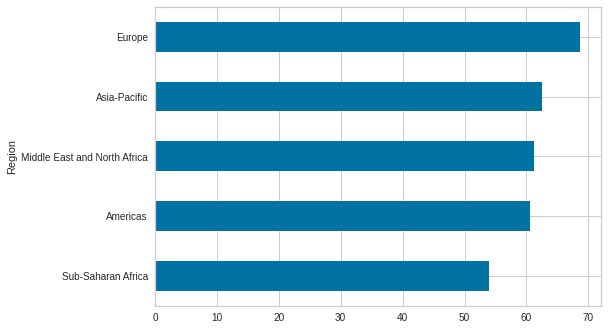

In [57]:
EFIndexData.groupby('Region')['2019_Score'].mean().sort_values().plot.barh()

**Observations**

* From the horizontal bar plot above, according to the dataset, in 2019, Europe enjoys the highest economic freedom level on average.


In [58]:
EFIndexData.groupby('Region')['2019_Score'].std()

Region
Americas                        10.759597
Asia-Pacific                    10.765804
Europe                           6.927649
Middle East and North Africa     9.324304
Sub-Saharan Africa               7.217708
Name: 2019_Score, dtype: float64

**Observations**

Which region has the largest standard deviation in the 2019 Economic Freedom Index?:

* The Asia-Pacific region has the largest standard deviation followed by the 
* Americas and then  
* Middle East and North Africa subsequented by
* Sub-Saharan Africa  and finally the region with the least is
* Europe.


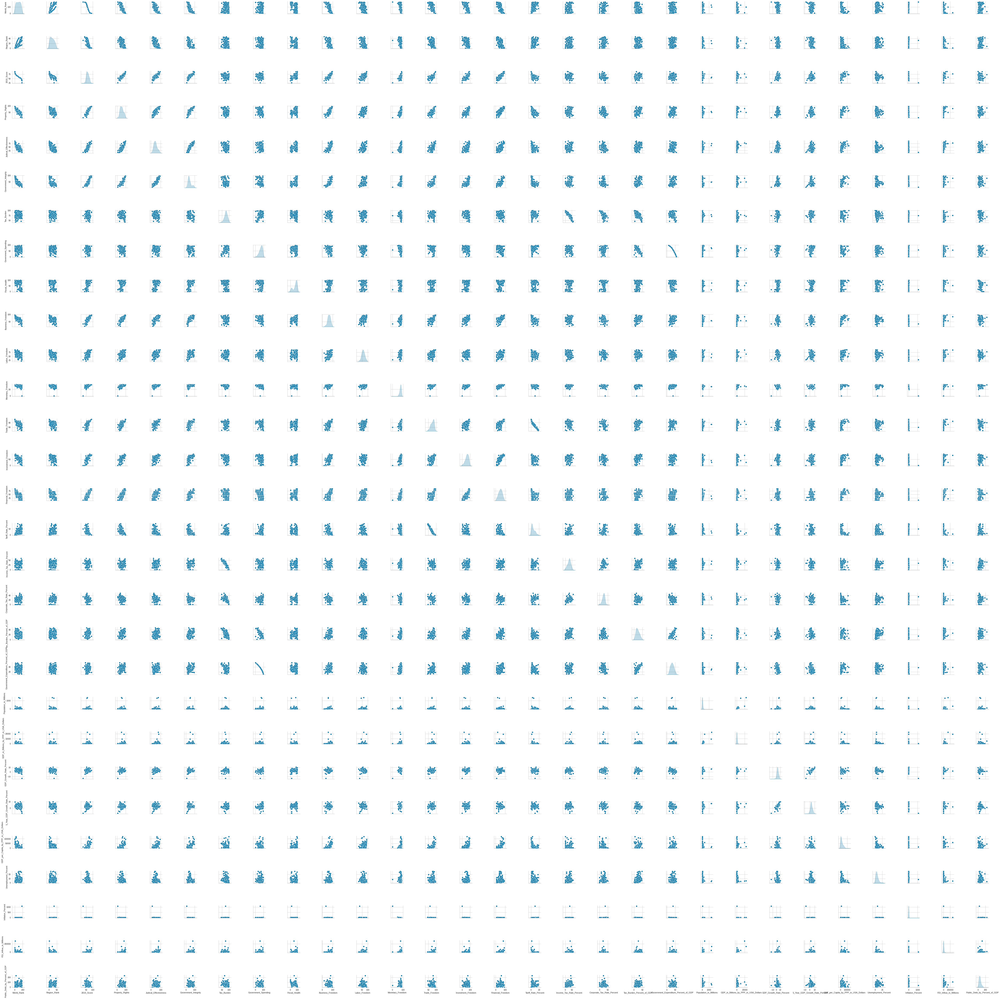

In [59]:
sns.pairplot(data=EFIndexData[num_col], diag_kind="kde")
plt.show()

**Observations**

- The pairplot chart further illustrates the observations mentioned in the earlier analyses.
- *Tariff_Rate-Percent* and *Trade_Freedom* are perfectly negatively correlated.
- *2019 Score* is highly positively correlated with many variables.

We will drop the *Tariff_Rate_Percent* column from the data.

In [60]:
EFIndexData.drop("Tariff_Rate_Percent", axis=1, inplace=True)

### Data Preprocessing

#### Scaling

In [61]:
scaler = StandardScaler()
to_exclude = [
    "CountryID",
    "Country_Name",
    "WEBNAME",
    "Region",
    "World_Rank",
    "Region_Rank",
    "Country",
]

# columns to be used for clustering are
col_for_clustering = [c for c in EFIndexData.columns if c not in to_exclude]
print(col_for_clustering)

['2019_Score', 'Property_Rights', 'Judical_Effectiveness', 'Government_Integrity', 'Tax_Burden', 'Government_Spending', 'Fiscal_Health', 'Business_Freedom', 'Labor_Freedom', 'Monetary_Freedom', 'Trade_Freedom', 'Investment_Freedom', 'Financial_Freedom', 'Income_Tax_Rate_Percent', 'Corporate_Tax_Rate_Percent', 'Tax_Burden_Percent_of_GDP', 'Government_Expenditure_Percent_of_GDP', 'Population_in_Millions', 'GDP_in_Billions_by_PPP_in_USA_Dollars', 'GDP_Growth_Rate_Percent', '5_Year_GDP_Growth_Rate_Percent', 'GDP_per_Capita_by_PPP_in_USA_Dollars', 'Unemployment_Percent', 'Inflation_Percent', 'FDI_Inflow_in_Millions', 'Public_Debt_by_Percent_of_GDP']


In [62]:
EFIndexData_scaled = EFIndexData[col_for_clustering].copy()
EFIndexData_scaled.iloc[:, :] = scaler.fit_transform(EFIndexData_scaled.iloc[:, :])
EFIndexData_scaled.head()

,2019_Score,Property_Rights,Judical_Effectiveness,Government_Integrity,Tax_Burden,Government_Spending,Fiscal_Health,Business_Freedom,Labor_Freedom,Monetary_Freedom,Trade_Freedom,Investment_Freedom,Financial_Freedom,Income_Tax_Rate_Percent,Corporate_Tax_Rate_Percent,Tax_Burden_Percent_of_GDP,Government_Expenditure_Percent_of_GDP,Population_in_Millions,GDP_in_Billions_by_PPP_in_USA_Dollars,GDP_Growth_Rate_Percent,5_Year_GDP_Growth_Rate_Percent,GDP_per_Capita_by_PPP_in_USA_Dollars,Unemployment_Percent,Inflation_Percent,FDI_Inflow_in_Millions,Public_Debt_by_Percent_of_GDP
Country,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,-0.959866,-1.771283,-0.934381,-0.859921,1.190865,0.683410,1.057424,-1.053944,0.025371,0.107381,-0.835841,-2.276011,-2.101765,-0.651980,-0.442440,-1.683992,-0.620165,-0.044102,-0.265930,-0.288490,-0.110439,-0.852011,0.259212,-0.071310,-0.312060,-1.462449
Albania,0.501988,0.064576,-0.877563,-0.094849,0.731399,0.377140,0.448782,0.310799,-0.535102,0.614025,1.183693,0.534815,1.078456,-0.424652,-1.007244,0.281988,-0.243612,-0.262209,-0.279483,0.222272,-0.273044,-0.386777,1.159969,-0.107754,-0.271768,0.430524
Algeria,-1.476388,-1.145422,-0.559381,-0.673687,-0.110957,-0.828800,-1.565920,-0.212013,-0.738910,-0.082610,-0.706146,-1.339069,-1.041691,0.484660,-0.103558,0.242471,0.905356,-0.003960,-0.038708,-0.470905,-0.029137,-0.266378,0.471155,-0.064021,-0.268594,-0.914405
Angola,-1.047577,-0.921155,-1.104836,-1.096490,0.527191,0.702552,-0.280286,-0.612610,-0.091091,-2.140851,-1.280509,-1.339069,-0.511654,-0.879308,0.687167,-0.142822,-0.649130,-0.092942,-0.217242,-0.945184,-0.110439,-0.640541,0.153240,0.253049,-0.399377,0.255742
Argentina,-0.891646,-0.300510,-0.087789,-0.442151,-0.715070,-0.790516,-1.100488,-0.565081,-0.957276,-1.634207,-0.465284,-0.167891,0.548420,0.484660,0.687167,0.864867,0.866735,0.013435,0.077183,-0.142558,-1.004764,-0.017685,0.241550,0.180159,0.134403,-0.120482


In [63]:
# creating dataframe copies for k-means and hierarchical clustering
km_EFIndexData = EFIndexData.copy()
hc_EFIndexData = EFIndexData.copy()

### Clustering

#### K-means Clustering

Number of Clusters: 2 	Average Distortion: 4.093218009349731
Number of Clusters: 3 	Average Distortion: 3.8409038095509507
Number of Clusters: 4 	Average Distortion: 3.73086662404098
Number of Clusters: 5 	Average Distortion: 3.6227617453058927
Number of Clusters: 6 	Average Distortion: 3.4897621376752954
Number of Clusters: 7 	Average Distortion: 3.394929716849047
Number of Clusters: 8 	Average Distortion: 3.2797201927385564
Number of Clusters: 9 	Average Distortion: 3.2188238845492423
Number of Clusters: 10 	Average Distortion: 3.1615896791154574


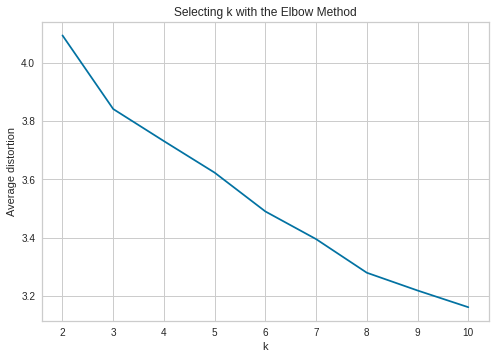

In [64]:
clusters = range(2, 11)
meanDistortions = []

for k in clusters:
    model = KMeans(n_clusters=k)
    model.fit(EFIndexData_scaled)
    prediction = model.predict(EFIndexData_scaled)
    distortion = (
        sum(
            np.min(cdist(EFIndexData_scaled, model.cluster_centers_, "euclidean"), axis=1)
        )
        / EFIndexData_scaled.shape[0]
    )

    meanDistortions.append(distortion)

    print("Number of Clusters:", k, "\tAverage Distortion:", distortion)

plt.plot(clusters, meanDistortions, "bx-")
plt.xlabel("k")
plt.ylabel("Average distortion")
plt.title("Selecting k with the Elbow Method")
plt.show()

**Observations**

The appropriate value of k from the Elbow curve seems to be 3, 5, 6, or 7.

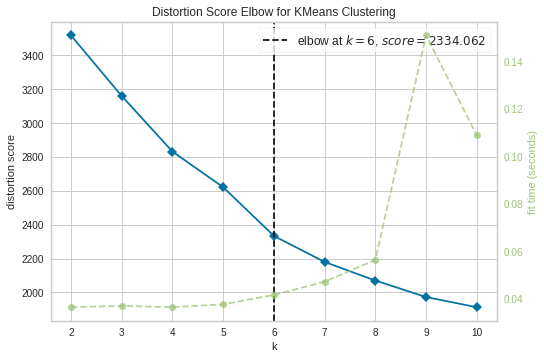

In [65]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2, 11), timings=True)
visualizer.fit(EFIndexData_scaled)  # fit the data to the visualizer
visualizer.show()  # finalize and render figure

**Check the silhouette scores.**

For n_clusters = 2, the silhouette score is 0.21186865310179862)
For n_clusters = 3, the silhouette score is 0.15389399862337258)
For n_clusters = 4, the silhouette score is 0.1594540534638782)
For n_clusters = 5, the silhouette score is 0.17060819139842529)
For n_clusters = 6, the silhouette score is 0.14371263797754472)
For n_clusters = 7, the silhouette score is 0.15405930576058116)
For n_clusters = 8, the silhouette score is 0.12905730549904978)
For n_clusters = 9, the silhouette score is 0.127997604920279)
For n_clusters = 10, the silhouette score is 0.11979894044745569)


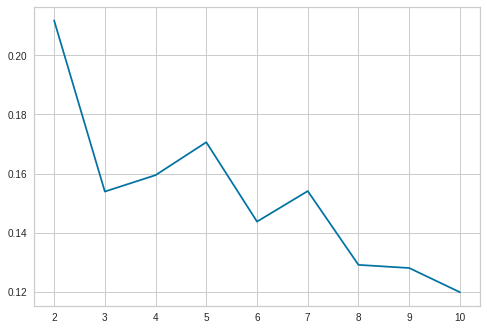

In [66]:
sil_score = []
cluster_list = list(range(2, 11))
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict((EFIndexData_scaled))
    # centers = clusterer.cluster_centers_
    score = silhouette_score(EFIndexData_scaled, preds)
    sil_score.append(score)
    print("For n_clusters = {}, the silhouette score is {})".format(n_clusters, score))

plt.plot(cluster_list, sil_score)
plt.show()

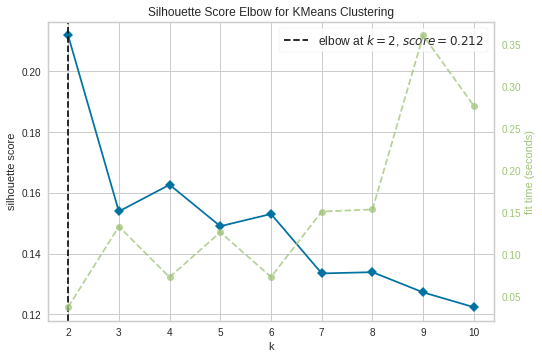

In [67]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2, 11), metric="silhouette", timings=True)
visualizer.fit(EFIndexData_scaled)  # fit the data to the visualizer
visualizer.show()  # finalize and render figure

**Observations**

From the silouette scores, it seems that 4 is a reasonable value for k.

**Silhouette Plot**

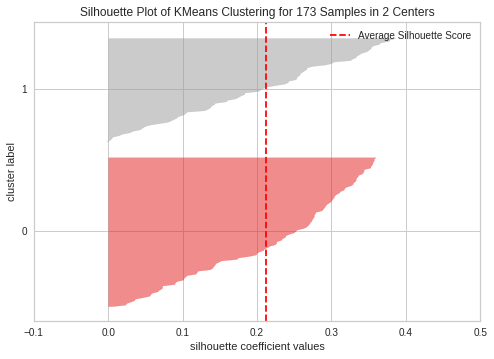

In [68]:
# Finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(2, random_state=1))
visualizer.fit(EFIndexData_scaled)
visualizer.show()

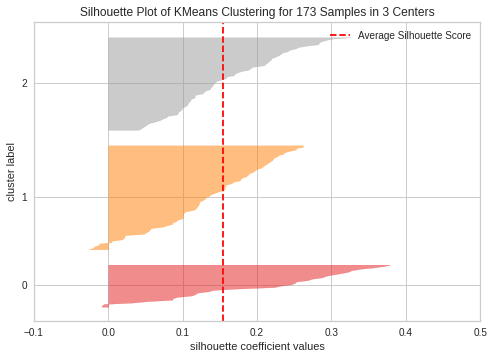

In [69]:
# Finding optimal no. of clusters with silhouette coefficients

visualizer = SilhouetteVisualizer(KMeans(3, random_state=1))
visualizer.fit(EFIndexData_scaled)
visualizer.show()

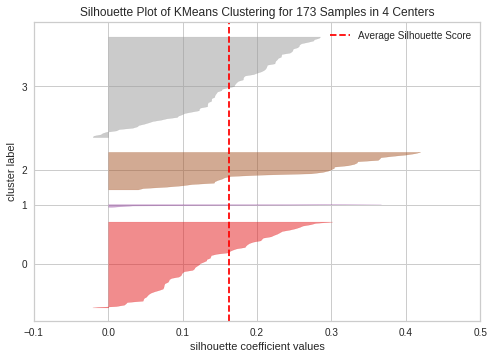

In [70]:
# Finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(4, random_state=1))
visualizer.fit(EFIndexData_scaled)
visualizer.show()

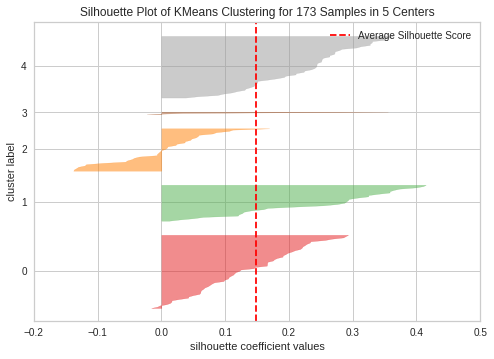

In [71]:
# Finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(5, random_state=1))
visualizer.fit(EFIndexData_scaled)
visualizer.show()

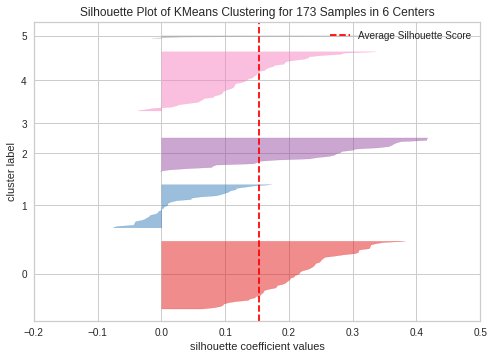

In [72]:
# Finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(6, random_state=1))
visualizer.fit(EFIndexData_scaled)
visualizer.show()

**We will proceed with k=4.**

**Check additional internal performance evaluation scores as well as external performance evaluation scores too.**

In [73]:
# Make a copy of the data set for the evaluation scores

EFIndexData_scaled_Scores = EFIndexData_scaled.copy()

# split dataset in two parts: features and target 

features = EFIndexData_scaled_Scores.drop(['2019_Score'], axis=1)

target = EFIndexData_scaled_Scores['2019_Score']
 
# partition data into training and testing set 

from sklearn.model_selection import train_test_split
feature_train, feature_test, target_train, target_test = train_test_split(features, target, test_size=0.3, random_state=1)


In [74]:
# Import metrics module for performance evaluation

from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import fowlkes_mallows_score
 
# Specify the number of clusters
num_clusters = 4
 
# Create and fit the KMeans model
clusterer = KMeans(n_clusters=num_clusters)
clusterer.fit(feature_train)
 
# Predict the target variable
predictions=clusterer.predict(feature_test)
 
# Calculate internal performance evaluation measures
print('Internal performance evaluation measures:')
print('                                        ')
print("Davies-Bouldin Index:", davies_bouldin_score(feature_test, predictions))
print("Silhouette Coefficient:", silhouette_score(feature_test, predictions))
print('                                        ')
# Calculate External performance evaluation measures
print('External performance evaluation measures:')
print('                                        ')
print("Adjusted Rand Score:", adjusted_rand_score(target_test, predictions))
print("Fowlkes Mallows Score:", fowlkes_mallows_score(target_test, predictions))
print('                                        ')

Internal performance evaluation measures:
                                        
Davies-Bouldin Index: 1.172443166805477
Silhouette Coefficient: 0.23167922949483527
                                        
External performance evaluation measures:
                                        
Adjusted Rand Score: 0.00016833954085390232
Fowlkes Mallows Score: 0.03937496154790789
                                        


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/cluster/_supervised.py:65: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/cluster/_supervised.py:65: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


**Observations**

Using 3 clusters the evaluation measures give us the above detailed scores. 

* A Davies-Bouldin index score of approximately 1.2 is okay as the closer the score is to 1 the better the quality of the clusters. 

* The Silhouette coefficient is 0.22 is a decent one for the number of clusters.

* An Adjusted Rand Score close to zero is not that great an indicator that the clusters are not similar. Perfect labeling would be scored 1 and bad labelling or independent labelling is scored 0 or negative.

* The minimum possible value of the Fowlkes–Mallows index is 0, which corresponds to the worst binary classification possible, where all the elements have been misclassified. And the maximum possible value of the Fowlkes–Mallows index is 1, which corresponds to the best binary classification possible, where all the elements have been perfectly classified.  Our Fowlkes Mallows score of 0.06 is not that great.



In [75]:
# let's take 4 as number of clusters
kmeans = KMeans(n_clusters=4, random_state=0)
kmeans.fit(EFIndexData_scaled)

KMeans(n_clusters=4, random_state=0)

In [76]:
# adding kmeans cluster labels to the original and scaled dataframes

km_EFIndexData["K_means_segments"] = kmeans.labels_
EFIndexData_scaled["K_means_segments"] = kmeans.labels_

#### Hierarchical Clustering

In [77]:
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# list of linkage methods
linkage_methods = ["single", "complete", "average", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(EFIndexData_scaled, metric=dm, method=lm)
        c, coph_dists = cophenet(Z, pdist(EFIndexData_scaled))
        print(
            "Cophenetic correlation for {} distance and {} linkage is {}.".format(
                dm.capitalize(), lm, c
            )
        )
        if high_cophenet_corr < c:
            high_cophenet_corr = c
            high_dm_lm[0] = dm
            high_dm_lm[1] = lm

Cophenetic correlation for Euclidean distance and single linkage is 0.7891817411656677.
Cophenetic correlation for Euclidean distance and complete linkage is 0.7474836807497028.
Cophenetic correlation for Euclidean distance and average linkage is 0.8609891664477334.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.7862995372373096.
Cophenetic correlation for Chebyshev distance and single linkage is 0.7804081959099154.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.7175233887755735.
Cophenetic correlation for Chebyshev distance and average linkage is 0.8137296767427991.
Cophenetic correlation for Chebyshev distance and weighted linkage is 0.8079016708635536.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.770129706657455.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.4588560265047875.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.7588143407821285.
Cophenetic cor

In [78]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation

print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.8609891664477334, which is obtained with Euclidean distance and average linkage.


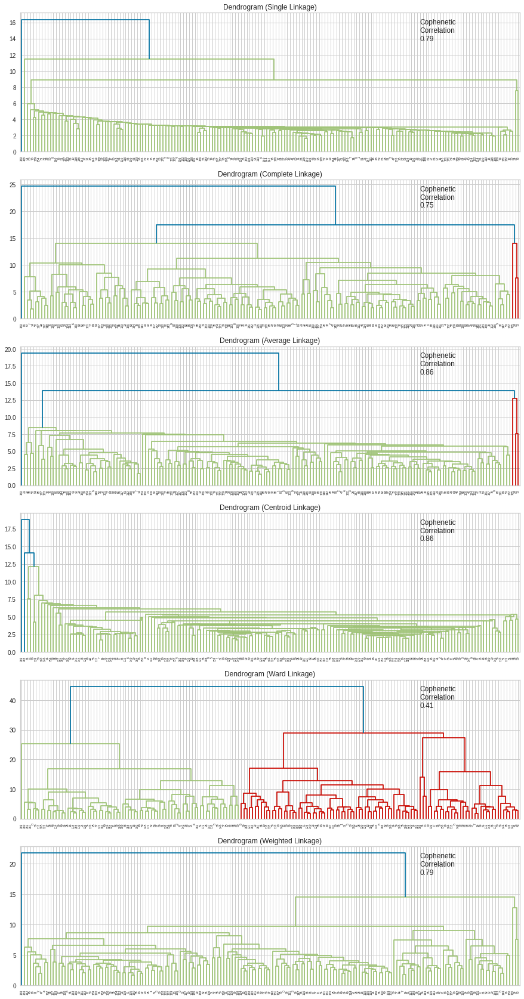

In [79]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]
compare = []

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(EFIndexData_scaled, metric="euclidean", method=method)

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(EFIndexData_scaled))
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

    compare.append([method, coph_corr])

**Observations**

- Looking the the above dendrograms, the Ward linkage seems to result in the best separation between clusters, even though its cophenetic correlation is lower than the other linkages.
- 4 looks to be a good choice for k.

In [80]:
hc = AgglomerativeClustering(n_clusters=4, affinity="euclidean", linkage="ward")
hc_labels = hc.fit_predict(EFIndexData_scaled)

In [81]:
hc_EFIndexData["HC_segments"] = hc_labels

## Clustering Profiling and Comparison

### K-means Clustering

In [82]:
pd.crosstab(km_EFIndexData.K_means_segments, km_EFIndexData.Region)

Region,Americas,Asia-Pacific,Europe,Middle East and North Africa,Sub-Saharan Africa
K_means_segments,,,,,
0,15,15,22,8,8
1,1,7,20,1,0
2,13,16,1,5,38
3,1,2,0,0,0


**Observations**

- Majority of the European countries are in Cluster 0 and Cluster 1.
- Majority of Asia-Pacific, American, MIddle East, and North Africa countries are in Cluster 0 and Cluster 2.
- Almost all Sub-Saharan African countries are in Cluster 2.
- There are an additional 9 countries asides from European nations in cluster 1.
- Cluster 3 has only 3 cointries in it (2 from the Asia-Pacific Region and 1 from the Americas).

In [83]:
clusters = km_EFIndexData.K_means_segments.unique().tolist()
for cl in clusters:
    print(
        "The",
        km_EFIndexData[km_EFIndexData["K_means_segments"] == cl]["Country_Name"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(km_EFIndexData[km_EFIndexData["K_means_segments"] == cl]["Country_Name"].unique())
    print("-" * 100, "\n")

The 73 countries in cluster 2 are:
['Afghanistan' 'Algeria' 'Angola' 'Argentina' 'Bangladesh' 'Belize'
 'Benin' 'Bolivia' 'Burkina Faso' 'Burma' 'Burundi' 'Cambodia' 'Cameroon'
 'Central African Republic' 'Chad' 'Comoros'
 'Congo, Democratic Republic of the Congo' 'Congo, Republic of'
 "Côte d'Ivoire" 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Ethiopia' 'Gabon' 'Gambia'
 'Ghana' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras'
 'Iran' 'Kenya' 'Laos' 'Lebanon' 'Liberia' 'Madagascar' 'Malawi' 'Mali'
 'Mauritania' 'Mozambique' 'Nepal' 'Nicaragua' 'Niger' 'Nigeria'
 'Pakistan' 'Papua New Guinea' 'Philippines' 'São Tomé and Príncipe'
 'Senegal' 'Sierra Leone' 'Solomon Islands' 'Sri Lanka' 'Sudan' 'Suriname'
 'Tajikistan' 'Tanzania' 'Timor-Leste' 'Togo' 'Tunisia' 'Turkmenistan'
 'Uganda' 'Ukraine' 'Uzbekistan' 'Venezuela' 'Vietnam' 'Zambia' 'Zimbabwe']
------------------------------------------------------------------------

In [84]:
km_EFIndexData_profiling = km_EFIndexData.groupby("K_means_segments")[col_for_clustering].mean()
km_EFIndexData_profiling["count_in_each_segment"] = (
    km_EFIndexData.groupby("K_means_segments")["2019_Score"].count().values
)

# displaying the group-wise means of variables
km_EFIndexData_profiling.style.highlight_max(color="green", axis=0)

,2019_Score,Property_Rights,Judical_Effectiveness,Government_Integrity,Tax_Burden,Government_Spending,Fiscal_Health,Business_Freedom,Labor_Freedom,Monetary_Freedom,Trade_Freedom,Investment_Freedom,Financial_Freedom,Income_Tax_Rate_Percent,Corporate_Tax_Rate_Percent,Tax_Burden_Percent_of_GDP,Government_Expenditure_Percent_of_GDP,Population_in_Millions,GDP_in_Billions_by_PPP_in_USA_Dollars,GDP_Growth_Rate_Percent,5_Year_GDP_Growth_Rate_Percent,GDP_per_Capita_by_PPP_in_USA_Dollars,Unemployment_Percent,Inflation_Percent,FDI_Inflow_in_Millions,Public_Debt_by_Percent_of_GDP,count_in_each_segment
K_means_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,64.763235,58.663235,48.236765,42.820588,83.085294,63.513235,70.758824,69.804412,64.785294,77.911765,78.819118,63.970588,54.705882,20.925000,19.595588,23.154412,33.914706,20.680882,418.480882,2.994118,2.691176,24261.955882,9.161765,3.167647,4262.980882,53.569118,68
1,74.775862,83.637931,71.062069,76.000000,64.175862,46.434483,85.579310,82.403448,64.951724,82.758621,86.310345,81.896552,72.068966,41.565517,22.731034,33.486207,40.975862,24.220690,1098.879310,3.086207,2.593103,50956.413793,5.865517,1.510345,20269.748276,67.958621,29
2,52.747945,36.508219,33.006849,27.741096,78.178082,76.045205,56.454795,52.924658,53.486301,70.879452,66.906849,44.657534,36.164384,30.236986,28.321918,16.679452,26.693151,29.319178,188.489041,3.565753,3.753425,6438.739726,6.339726,22.109589,1468.976712,54.302740,73
3,63.466667,62.166667,71.800000,58.100000,74.966667,68.166667,47.933333,65.700000,65.133333,73.633333,77.333333,50.000000,46.666667,37.633333,26.133333,16.900000,32.300000,1010.966667,17336.233333,5.300000,5.500000,27781.333333,4.200000,2.433333,150539.033333,75.266667,3


In [85]:
# let's plot the attributes of only the big clusters
c1 = [0, 1, 2]
km_EFIndexData2 = km_EFIndexData[km_EFIndexData.K_means_segments.isin(c1)]

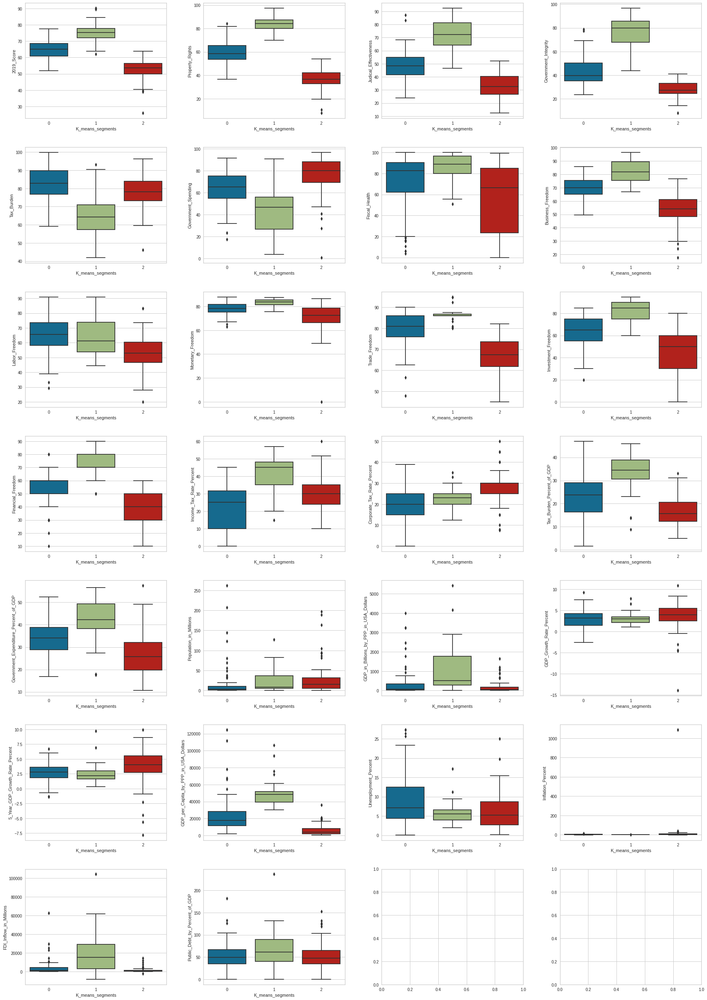

In [86]:
fig, axes = plt.subplots(7, 4, figsize=(25, 35))
counter = 0

for ii in range(7):
    for jj in range(4):
        if counter < 26:
            sns.boxplot(
                ax=axes[ii][jj],
                y=km_EFIndexData2[col_for_clustering[counter]],
                x=km_EFIndexData2["K_means_segments"],
            )
            counter = counter + 1

fig.tight_layout(pad=3.0)

### Insights

- **Cluster 0**:
  - There are 68 countries in this cluster.
  - Countries in this cluster have a moderate 2019 score with a mean value of ~66.
  - Countries in this cluster have moderate business and trade freedom scores.
  - The mean population across countries in this cluster is low.
  - Countries in this cluster have a mean low GDP (with a large spread) and a moderate GDP growth rate.
  - The unemployment rate of the countries in this cluster has a high variance with a comparatively high mean and very high outliers.
  - Comparatively moderate amounts of foreign domestic investment (FDI) on average in these countries with very moderate variance and several outliers.
  - Comparatively slightly lower public debt with large variance.


- **Cluster 1**:
  - There are 29 countries in this cluster.
  - Countries in this cluster have a high 2019 score with a mean value of ~76.
  - Countries in this cluster have high business and trade freedom scores.
  - The mean population across countries in this cluster is moderate with a large spread.
  - Countries in this cluster have a high GDP and low GDP growth rates.
  - The unemployment rate of the countries in this cluster has a low variance with a comparatively moderate mean and some outliers.
  - Large amounts of foreign domestic investment (FDI) on average in these countries with high variance.
  - Large public debt with large variance and highest outlier comparatively with these 3 clusters.


- **Cluster 2**:
  - There are 73 countries in this cluster.
  - Countries in this cluster have a low 2019 score with a mean value of ~55.
  - Countries in this cluster have low business and trade freedom scores.
  - The mean population across countries in this cluster is high with a narrower spread and many outliers.
  - Countries in this cluster have a low GDP and high GDP growth rates.
  - The unemployment rate of the countries in this cluster has a large variance with a comparatively lower mean and outliers.
  - Comparatively smaller amounts of foreign domestic investment (FDI) on average in these countries with very low variance.
  - Similar public debt distribution to cluster 0 with several outliers though highets outlier is not as high as cluster 0 and cluster 1.

### Hierarchical Clustering

In [87]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData.Region)

Region,Americas,Asia-Pacific,Europe,Middle East and North Africa,Sub-Saharan Africa
HC_segments,,,,,
0,15,16,2,5,38
1,2,7,22,1,0
2,12,15,19,8,8
3,1,2,0,0,0


**Observations**

- Majority of the European countries are in Cluster 1 and Cluster 2.
- Majority of Asia-Pacific, American, Middle East, and North Africa countries are in Cluster 0 and Cluster 2.
- Almost all Sub-Saharan African countries are in Cluster 0.
- There are only 3 countries in Cluster 3.

In [88]:
clusters = hc_EFIndexData.HC_segments.unique().tolist()
for cl in clusters:
    print(
        "The",
        hc_EFIndexData[hc_EFIndexData["HC_segments"] == cl]["Country_Name"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(hc_EFIndexData[hc_EFIndexData["HC_segments"] == cl]["Country_Name"].unique())
    print("-" * 100, "\n")

The 76 countries in cluster 0 are:
['Afghanistan' 'Algeria' 'Angola' 'Argentina' 'Bangladesh' 'Belize'
 'Benin' 'Bolivia' 'Brazil' 'Burkina Faso' 'Burma' 'Burundi' 'Cambodia'
 'Cameroon' 'Central African Republic' 'Chad' 'Comoros'
 'Congo, Democratic Republic of the Congo' 'Congo, Republic of'
 "Côte d'Ivoire" 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Ethiopia' 'Gabon' 'Gambia'
 'Ghana' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras'
 'Iran' 'Kenya' 'Laos' 'Lebanon' 'Liberia' 'Madagascar' 'Malawi' 'Mali'
 'Mauritania' 'Moldova' 'Mozambique' 'Nepal' 'Nicaragua' 'Niger' 'Nigeria'
 'Pakistan' 'Papua New Guinea' 'Paraguay' 'Philippines'
 'São Tomé and Príncipe' 'Senegal' 'Sierra Leone' 'Solomon Islands'
 'Sri Lanka' 'Sudan' 'Suriname' 'Tajikistan' 'Tanzania' 'Timor-Leste'
 'Togo' 'Tunisia' 'Turkmenistan' 'Uganda' 'Ukraine' 'Uzbekistan'
 'Venezuela' 'Vietnam' 'Zambia' 'Zimbabwe']
-----------------------------------------

In [89]:
hc_EFIndexData_profiling = hc_EFIndexData.groupby("HC_segments")[col_for_clustering].mean()
hc_EFIndexData_profiling["count_in_each_segment"] = (
    hc_EFIndexData.groupby("HC_segments")["2019_Score"].count().values
)

# displaying the group-wise means of variables
hc_EFIndexData_profiling.style.highlight_max(color="blue", axis=0)

,2019_Score,Property_Rights,Judical_Effectiveness,Government_Integrity,Tax_Burden,Government_Spending,Fiscal_Health,Business_Freedom,Labor_Freedom,Monetary_Freedom,Trade_Freedom,Investment_Freedom,Financial_Freedom,Income_Tax_Rate_Percent,Corporate_Tax_Rate_Percent,Tax_Burden_Percent_of_GDP,Government_Expenditure_Percent_of_GDP,Population_in_Millions,GDP_in_Billions_by_PPP_in_USA_Dollars,GDP_Growth_Rate_Percent,5_Year_GDP_Growth_Rate_Percent,GDP_per_Capita_by_PPP_in_USA_Dollars,Unemployment_Percent,Inflation_Percent,FDI_Inflow_in_Millions,Public_Debt_by_Percent_of_GDP,count_in_each_segment
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,52.939474,37.067105,33.168421,27.685526,78.410526,75.585526,56.781579,53.288158,52.955263,71.000000,67.207895,45.263158,36.842105,29.773684,27.940789,17.030263,26.981579,31.032895,224.847368,3.547368,3.735526,6593.657895,6.384211,21.415789,2243.651316,54.097368,76
1,73.828125,81.746875,68.975000,73.000000,64.831250,46.356250,85.031250,81.590625,63.853125,82.746875,86.212500,80.625000,70.937500,41.325000,22.146875,33.375000,40.987500,23.003125,1022.840625,2.890625,2.250000,48422.250000,6.775000,1.487500,18870.643750,71.918750,32
2,65.114516,58.817742,48.748387,43.561290,83.614516,64.337097,70.616129,69.985484,66.541935,77.875806,78.714516,63.951613,54.516129,20.167742,19.790323,22.595161,33.562903,18.619355,391.364516,3.085484,2.843548,24950.758065,8.933871,3.193548,3396.170968,51.045161,62
3,63.466667,62.166667,71.800000,58.100000,74.966667,68.166667,47.933333,65.700000,65.133333,73.633333,77.333333,50.000000,46.666667,37.633333,26.133333,16.900000,32.300000,1010.966667,17336.233333,5.300000,5.500000,27781.333333,4.200000,2.433333,150539.033333,75.266667,3


In [90]:
# Let's plot the attributes of only the big clusters
c1 = [0, 1, 2]
hc_EFIndexData2 = hc_EFIndexData[hc_EFIndexData.HC_segments.isin(c1)]

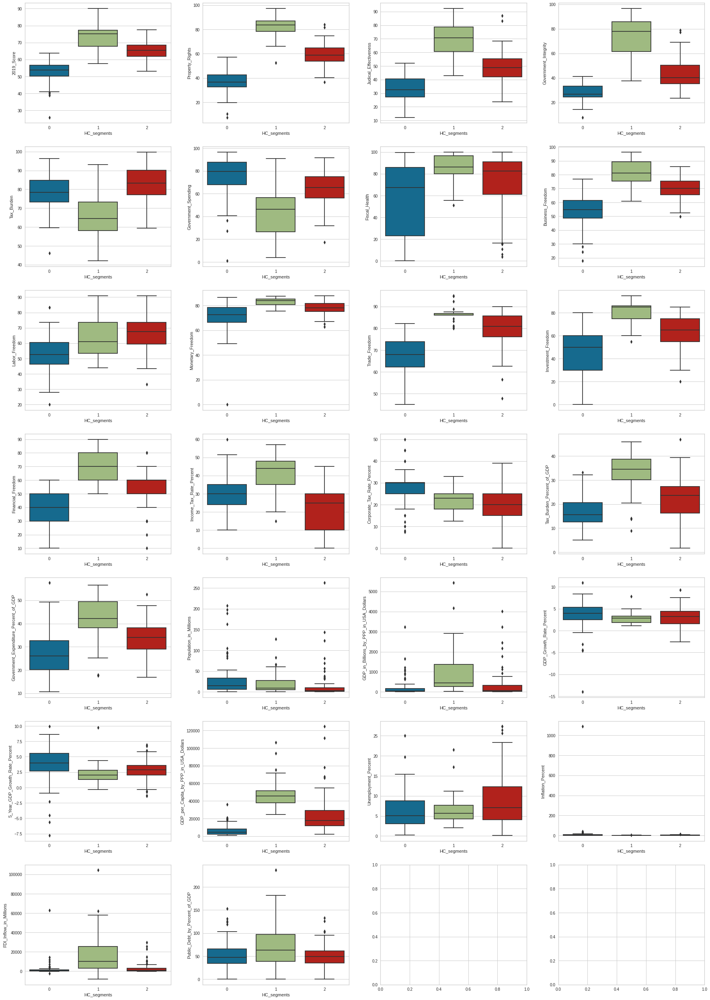

In [91]:
fig, axes = plt.subplots(7, 4, figsize=(25, 35))
counter = 0

for ii in range(7):
    for jj in range(4):
        if counter < 26:
            sns.boxplot(
                ax=axes[ii][jj],
                y=hc_EFIndexData2[col_for_clustering[counter]],
                x=hc_EFIndexData2["HC_segments"],
            )
            counter = counter + 1

fig.tight_layout(pad=2.0)

### Insights

- **Cluster 0**:
  - There are 76 countries in this cluster.
  - Countries in this cluster have a low 2019 score with a mean value of ~54.
  - Countries in this cluster have low business and trade freedom scores.
  - The mean population across countries in this cluster is high with wide variance.
  - Countries in this cluster have a low GDP and comparatively high GDP growth rate with wide variance from -15% to 11%.
  - The unemployment rate of the countries in this cluster has moderate variance with a comparatively low mean.
  - Comparatively low amounts of foreign domestic investment (FDI) on average in these countries with very moderate variance and several outliers.
  - Comparatively moderate public debt with large variance.



- **Cluster 1**:
  - There are 62 countries in this cluster.
  - Countries in this cluster have a high 2019 score with a mean value of ~76.
  - Countries in this cluster have high business and trade freedom scores.
  - The mean population across countries in this cluster is comparativfely moderate with high variance and the highest positive number outlier in all 3 cluisters.
  - Countries in this cluster have a high GDP and comparatively low GDP growth rate.
  - The unemployment rate of the countries in this cluster has a moderate variance with a comparatively moderate mean.
  - Comparatively high amounts of foreign domestic investment (FDI) on average in these countries with very high variance and a few outliers.
  - Comparatively high public debt with large variance.


- **Cluster 2**:
  - There are 32 countries in this cluster.
  - Countries in this cluster have a moderate 2019 score with a mean value of ~66.
  - Countries in this cluster have moderate business and trade freedom scores.
  - The mean population across countries in this cluster is low.
  - Countries in this cluster have a moderate GDP and comparatively moderate GDP growth rate.
  - The unemployment rate of the countries in this cluster has wide variance with a comparatively high mean.
  - Comparatively low amounts of foreign domestic investment (FDI) on average in these countries with low variance and several outliers.
  - Comparatively moderate public debt with large variance.

### K-Means Clustering vs Hierarchical Clustering Comparison

In [92]:
km_EFIndexData_profiling.style.highlight_max(color="green", axis=0)

,2019_Score,Property_Rights,Judical_Effectiveness,Government_Integrity,Tax_Burden,Government_Spending,Fiscal_Health,Business_Freedom,Labor_Freedom,Monetary_Freedom,Trade_Freedom,Investment_Freedom,Financial_Freedom,Income_Tax_Rate_Percent,Corporate_Tax_Rate_Percent,Tax_Burden_Percent_of_GDP,Government_Expenditure_Percent_of_GDP,Population_in_Millions,GDP_in_Billions_by_PPP_in_USA_Dollars,GDP_Growth_Rate_Percent,5_Year_GDP_Growth_Rate_Percent,GDP_per_Capita_by_PPP_in_USA_Dollars,Unemployment_Percent,Inflation_Percent,FDI_Inflow_in_Millions,Public_Debt_by_Percent_of_GDP,count_in_each_segment
K_means_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,64.763235,58.663235,48.236765,42.820588,83.085294,63.513235,70.758824,69.804412,64.785294,77.911765,78.819118,63.970588,54.705882,20.925000,19.595588,23.154412,33.914706,20.680882,418.480882,2.994118,2.691176,24261.955882,9.161765,3.167647,4262.980882,53.569118,68
1,74.775862,83.637931,71.062069,76.000000,64.175862,46.434483,85.579310,82.403448,64.951724,82.758621,86.310345,81.896552,72.068966,41.565517,22.731034,33.486207,40.975862,24.220690,1098.879310,3.086207,2.593103,50956.413793,5.865517,1.510345,20269.748276,67.958621,29
2,52.747945,36.508219,33.006849,27.741096,78.178082,76.045205,56.454795,52.924658,53.486301,70.879452,66.906849,44.657534,36.164384,30.236986,28.321918,16.679452,26.693151,29.319178,188.489041,3.565753,3.753425,6438.739726,6.339726,22.109589,1468.976712,54.302740,73
3,63.466667,62.166667,71.800000,58.100000,74.966667,68.166667,47.933333,65.700000,65.133333,73.633333,77.333333,50.000000,46.666667,37.633333,26.133333,16.900000,32.300000,1010.966667,17336.233333,5.300000,5.500000,27781.333333,4.200000,2.433333,150539.033333,75.266667,3


In [93]:
clusters = km_EFIndexData.K_means_segments.unique().tolist()
for cl in clusters:
    print(
        "The",
        km_EFIndexData[km_EFIndexData["K_means_segments"] == cl]["Country_Name"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(km_EFIndexData[km_EFIndexData["K_means_segments"] == cl]["Country_Name"].unique())
    print("-" * 100, "\n")

The 73 countries in cluster 2 are:
['Afghanistan' 'Algeria' 'Angola' 'Argentina' 'Bangladesh' 'Belize'
 'Benin' 'Bolivia' 'Burkina Faso' 'Burma' 'Burundi' 'Cambodia' 'Cameroon'
 'Central African Republic' 'Chad' 'Comoros'
 'Congo, Democratic Republic of the Congo' 'Congo, Republic of'
 "Côte d'Ivoire" 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Ethiopia' 'Gabon' 'Gambia'
 'Ghana' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras'
 'Iran' 'Kenya' 'Laos' 'Lebanon' 'Liberia' 'Madagascar' 'Malawi' 'Mali'
 'Mauritania' 'Mozambique' 'Nepal' 'Nicaragua' 'Niger' 'Nigeria'
 'Pakistan' 'Papua New Guinea' 'Philippines' 'São Tomé and Príncipe'
 'Senegal' 'Sierra Leone' 'Solomon Islands' 'Sri Lanka' 'Sudan' 'Suriname'
 'Tajikistan' 'Tanzania' 'Timor-Leste' 'Togo' 'Tunisia' 'Turkmenistan'
 'Uganda' 'Ukraine' 'Uzbekistan' 'Venezuela' 'Vietnam' 'Zambia' 'Zimbabwe']
------------------------------------------------------------------------

In [94]:
hc_EFIndexData_profiling.style.highlight_max(color="blue", axis=0)

,2019_Score,Property_Rights,Judical_Effectiveness,Government_Integrity,Tax_Burden,Government_Spending,Fiscal_Health,Business_Freedom,Labor_Freedom,Monetary_Freedom,Trade_Freedom,Investment_Freedom,Financial_Freedom,Income_Tax_Rate_Percent,Corporate_Tax_Rate_Percent,Tax_Burden_Percent_of_GDP,Government_Expenditure_Percent_of_GDP,Population_in_Millions,GDP_in_Billions_by_PPP_in_USA_Dollars,GDP_Growth_Rate_Percent,5_Year_GDP_Growth_Rate_Percent,GDP_per_Capita_by_PPP_in_USA_Dollars,Unemployment_Percent,Inflation_Percent,FDI_Inflow_in_Millions,Public_Debt_by_Percent_of_GDP,count_in_each_segment
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,52.939474,37.067105,33.168421,27.685526,78.410526,75.585526,56.781579,53.288158,52.955263,71.000000,67.207895,45.263158,36.842105,29.773684,27.940789,17.030263,26.981579,31.032895,224.847368,3.547368,3.735526,6593.657895,6.384211,21.415789,2243.651316,54.097368,76
1,73.828125,81.746875,68.975000,73.000000,64.831250,46.356250,85.031250,81.590625,63.853125,82.746875,86.212500,80.625000,70.937500,41.325000,22.146875,33.375000,40.987500,23.003125,1022.840625,2.890625,2.250000,48422.250000,6.775000,1.487500,18870.643750,71.918750,32
2,65.114516,58.817742,48.748387,43.561290,83.614516,64.337097,70.616129,69.985484,66.541935,77.875806,78.714516,63.951613,54.516129,20.167742,19.790323,22.595161,33.562903,18.619355,391.364516,3.085484,2.843548,24950.758065,8.933871,3.193548,3396.170968,51.045161,62
3,63.466667,62.166667,71.800000,58.100000,74.966667,68.166667,47.933333,65.700000,65.133333,73.633333,77.333333,50.000000,46.666667,37.633333,26.133333,16.900000,32.300000,1010.966667,17336.233333,5.300000,5.500000,27781.333333,4.200000,2.433333,150539.033333,75.266667,3


In [95]:
clusters = hc_EFIndexData.HC_segments.unique().tolist()
for cl in clusters:
    print(
        "The",
        hc_EFIndexData[hc_EFIndexData["HC_segments"] == cl]["Country_Name"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(hc_EFIndexData[hc_EFIndexData["HC_segments"] == cl]["Country_Name"].unique())
    print("-" * 100, "\n")

The 76 countries in cluster 0 are:
['Afghanistan' 'Algeria' 'Angola' 'Argentina' 'Bangladesh' 'Belize'
 'Benin' 'Bolivia' 'Brazil' 'Burkina Faso' 'Burma' 'Burundi' 'Cambodia'
 'Cameroon' 'Central African Republic' 'Chad' 'Comoros'
 'Congo, Democratic Republic of the Congo' 'Congo, Republic of'
 "Côte d'Ivoire" 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Ethiopia' 'Gabon' 'Gambia'
 'Ghana' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras'
 'Iran' 'Kenya' 'Laos' 'Lebanon' 'Liberia' 'Madagascar' 'Malawi' 'Mali'
 'Mauritania' 'Moldova' 'Mozambique' 'Nepal' 'Nicaragua' 'Niger' 'Nigeria'
 'Pakistan' 'Papua New Guinea' 'Paraguay' 'Philippines'
 'São Tomé and Príncipe' 'Senegal' 'Sierra Leone' 'Solomon Islands'
 'Sri Lanka' 'Sudan' 'Suriname' 'Tajikistan' 'Tanzania' 'Timor-Leste'
 'Togo' 'Tunisia' 'Turkmenistan' 'Uganda' 'Ukraine' 'Uzbekistan'
 'Venezuela' 'Vietnam' 'Zambia' 'Zimbabwe']
-----------------------------------------

**Observations**

- Looks like the K-Means and Hierarchical clusters are similar, except that the labels are swapped between clusters 0 and 2 and some of the countries have changed clusters.
- Let us swap the labels for K-Means for better analysis and comparison.

In [96]:
km_EFIndexData["K_means_segments"] = km_EFIndexData["K_means_segments"].replace({0: 2, 2: 0})

km_EFIndexData_profiling = km_EFIndexData.groupby("K_means_segments")[col_for_clustering].mean()
km_EFIndexData_profiling["count_in_each_segment"] = (
    km_EFIndexData.groupby("K_means_segments")["2019_Score"].count().values
)

In [97]:
km_EFIndexData_profiling.style.highlight_max(color="green", axis=0)

,2019_Score,Property_Rights,Judical_Effectiveness,Government_Integrity,Tax_Burden,Government_Spending,Fiscal_Health,Business_Freedom,Labor_Freedom,Monetary_Freedom,Trade_Freedom,Investment_Freedom,Financial_Freedom,Income_Tax_Rate_Percent,Corporate_Tax_Rate_Percent,Tax_Burden_Percent_of_GDP,Government_Expenditure_Percent_of_GDP,Population_in_Millions,GDP_in_Billions_by_PPP_in_USA_Dollars,GDP_Growth_Rate_Percent,5_Year_GDP_Growth_Rate_Percent,GDP_per_Capita_by_PPP_in_USA_Dollars,Unemployment_Percent,Inflation_Percent,FDI_Inflow_in_Millions,Public_Debt_by_Percent_of_GDP,count_in_each_segment
K_means_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,52.747945,36.508219,33.006849,27.741096,78.178082,76.045205,56.454795,52.924658,53.486301,70.879452,66.906849,44.657534,36.164384,30.236986,28.321918,16.679452,26.693151,29.319178,188.489041,3.565753,3.753425,6438.739726,6.339726,22.109589,1468.976712,54.302740,73
1,74.775862,83.637931,71.062069,76.000000,64.175862,46.434483,85.579310,82.403448,64.951724,82.758621,86.310345,81.896552,72.068966,41.565517,22.731034,33.486207,40.975862,24.220690,1098.879310,3.086207,2.593103,50956.413793,5.865517,1.510345,20269.748276,67.958621,29
2,64.763235,58.663235,48.236765,42.820588,83.085294,63.513235,70.758824,69.804412,64.785294,77.911765,78.819118,63.970588,54.705882,20.925000,19.595588,23.154412,33.914706,20.680882,418.480882,2.994118,2.691176,24261.955882,9.161765,3.167647,4262.980882,53.569118,68
3,63.466667,62.166667,71.800000,58.100000,74.966667,68.166667,47.933333,65.700000,65.133333,73.633333,77.333333,50.000000,46.666667,37.633333,26.133333,16.900000,32.300000,1010.966667,17336.233333,5.300000,5.500000,27781.333333,4.200000,2.433333,150539.033333,75.266667,3


In [98]:
clusters = km_EFIndexData.K_means_segments.unique().tolist()
for cl in clusters:
    print(
        "The",
        km_EFIndexData[km_EFIndexData["K_means_segments"] == cl]["Country_Name"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(km_EFIndexData[km_EFIndexData["K_means_segments"] == cl]["Country_Name"].unique())
    print("-" * 100, "\n")

The 73 countries in cluster 0 are:
['Afghanistan' 'Algeria' 'Angola' 'Argentina' 'Bangladesh' 'Belize'
 'Benin' 'Bolivia' 'Burkina Faso' 'Burma' 'Burundi' 'Cambodia' 'Cameroon'
 'Central African Republic' 'Chad' 'Comoros'
 'Congo, Democratic Republic of the Congo' 'Congo, Republic of'
 "Côte d'Ivoire" 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Ethiopia' 'Gabon' 'Gambia'
 'Ghana' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras'
 'Iran' 'Kenya' 'Laos' 'Lebanon' 'Liberia' 'Madagascar' 'Malawi' 'Mali'
 'Mauritania' 'Mozambique' 'Nepal' 'Nicaragua' 'Niger' 'Nigeria'
 'Pakistan' 'Papua New Guinea' 'Philippines' 'São Tomé and Príncipe'
 'Senegal' 'Sierra Leone' 'Solomon Islands' 'Sri Lanka' 'Sudan' 'Suriname'
 'Tajikistan' 'Tanzania' 'Timor-Leste' 'Togo' 'Tunisia' 'Turkmenistan'
 'Uganda' 'Ukraine' 'Uzbekistan' 'Venezuela' 'Vietnam' 'Zambia' 'Zimbabwe']
------------------------------------------------------------------------

**Observations**

- The country segments based on economic freedom matches to a large extent for both K-means and Hierarchical Clustering techniques.
- Cluster 3 is identical in both techniques with only 3 nations China, India, and the United States of America. These are 3 countries with very large populations.
- A few other countries have swapped clusters between K-means and Hierarchical clustering.

**Compare Hierarchical Clusters vs Various Attributes in the Data Set.**

In [99]:
pd.crosstab(hc_EFIndexData.HC_segments, EFIndexData.Region).style.highlight_max(
    color="blue", axis=0
)

Region,Americas,Asia-Pacific,Europe,Middle East and North Africa,Sub-Saharan Africa
HC_segments,,,,,
0,15,16,2,5,38
1,2,7,22,1,0
2,12,15,19,8,8
3,1,2,0,0,0


**Observations**

* Cluster 1 are the "developed countries" of which the majority are European nations, Cyprus, Australia, New Zealand, Canada, Japan, Taiwan, Hong Kong, Singapore, South Korea, and Israel.

* Cluster 2 are the "upper tier developing nations" with nations like Brazil, South Africa, Mexico, Botswana etc. to name a few. There might be some nations that should not be in this particular cluster such as eSwatini and Lesotho but there proximity and reliance on South African infrastructure skews their statistics; this is based on my domain knowledge of the economies of these 2 countries.

* Cluster 0 are the "lower tier developing nations" or "emerging nations" most of which are in Sub-Saharan Africa, South America and scattered territories in the the rest of the world.

* Cluster 3 are the countries with the largest populations in the world - China, India, and the United States of America. They also have the first (U.S.A), second (China), and fifth (India) largest economies in the world respectively. They are a unique trio of nations.

In [100]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Government_Integrity']).style.highlight_max(
    color="green", axis=0
)

Government_Integrity,7.9,14.3,15.8,16.7,18.2,19.7,20.3,20.5,23.2,23.4,24.2,24.4,25.2,25.3,25.4,25.5,26.2,26.3,26.4,27.2,28.1,28.9,29.2,29.6,29.8,30.2,30.6,30.9,31.8,32.1,32.3,32.9,33.2,33.5,34.0,34.1,35.0,35.1,35.3,35.5,36.4,36.6,37.2,37.7,38.1,38.6,39.2,39.5,39.7,39.8,40.3,40.4,41.2,43.7,44.7,45.0,47.8,49.1,49.8,50.3,50.5,51.9,52.1,52.4,53.6,53.8,54.5,55.4,58.5,59.5,62.3,67.9,69.2,72.5,73.1,77.4,78.0,78.8,79.9,81.3,83.8,84.6,85.8,88.0,89.1,92.3,92.5,95.1,96.7
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1,1,2,1,1,2,3,2,3,1,1,2,3,4,2,3,5,0,1,1,5,2,1,2,0,0,3,1,0,2,1,0,2,3,1,1,1,1,0,4,1,2,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,1,2,1,1,1,1,2,0,1,1,3,1,2,2,1,1,1,1,1
2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,1,0,1,1,0,0,1,1,2,0,1,1,1,2,1,1,1,1,3,1,1,1,2,1,1,2,1,1,3,2,1,1,0,3,3,1,1,1,1,1,2,2,1,1,0,0,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [101]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Property_Rights']).style.highlight_max(
    color="yellow", axis=0
)

Property_Rights,7.6,10.4,19.6,20.5,20.6,25.3,26.7,27.5,28.1,29.7,31.6,32.6,33.2,33.4,33.5,33.7,33.9,34.7,35.4,35.5,35.8,35.9,36.1,36.5,37.0,37.2,37.4,37.6,38.8,39.2,39.5,39.9,40.2,40.3,40.9,41.5,41.7,42.2,42.5,43.4,43.9,44.1,44.7,45.0,47.8,48.2,48.7,49.1,49.2,49.8,49.9,50.1,50.6,52.2,52.3,52.4,52.9,53.7,53.8,54.8,55.0,55.2,55.4,55.8,55.9,56.1,57.2,57.3,58.1,58.3,58.4,58.8,59.1,59.2,59.3,60.0,60.4,60.7,60.9,62.3,62.5,63.5,64.0,64.5,65.1,65.9,66.0,66.7,67.3,68.3,68.5,68.7,69.5,69.8,71.5,71.7,72.2,72.9,73.1,73.6,74.8,76.4,79.1,79.3,79.9,80.0,81.3,81.5,81.8,82.5,83.0,84.1,84.2,85.3,85.4,85.8,86.1,86.2,87.0,87.4,88.0,89.5,89.6,92.3,93.3,95.0,97.4
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1,1,2,1,1,1,2,2,1,4,2,2,2,1,1,1,1,2,1,3,1,2,1,2,1,2,3,1,1,1,2,1,0,1,1,1,2,1,1,1,1,0,1,1,3,0,1,3,1,2,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,1,1,0,0,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,1,0,0,1,1,0,0,0,1,0,0,0,0,1,1,0,1,1,1,2,1,1,1,1,1,1,1,1,1,2,0,2,1,1,1,2,2,1,1,1,1,1,1,2,1,1,1,1,3,0,1,2,1,1,0,1,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [102]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Judical_Effectiveness']).style.highlight_max(
    color="grey", axis=0
)

Judical_Effectiveness,12.3,13.1,18.1,18.7,20.2,22.2,23.8,24.4,24.6,24.8,25.3,26.6,27.6,27.9,29.1,29.6,29.8,30.0,30.1,30.6,30.7,31.0,31.3,31.5,32.3,32.6,32.8,33.4,34.0,34.3,34.5,34.7,34.9,35.2,35.6,36.2,36.4,37.2,37.9,38.5,39.0,39.3,39.4,40.1,40.2,40.3,40.4,40.6,40.9,41.3,41.4,41.9,42.5,42.7,42.9,43.3,44.0,44.2,44.5,44.8,45.1,45.2,45.7,45.9,46.3,46.5,46.9,47.1,47.6,47.8,48.1,48.3,48.4,49.0,49.2,49.5,49.8,50.4,50.7,51.4,51.6,51.7,51.8,51.9,52.1,52.6,53.1,53.5,54.0,54.6,54.7,55.4,56.0,56.1,56.3,57.5,58.9,59.9,60.0,60.7,61.2,61.6,62.1,62.7,63.8,64.3,66.1,68.2,68.4,68.5,69.4,70.1,71.3,72.4,73.4,74.7,75.2,75.3,75.4,76.0,77.8,78.6,81.2,82.0,83.2,83.5,84.0,85.9,86.5,87.1,92.4
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1,2,5,1,1,2,0,1,1,1,1,3,1,0,1,6,1,1,0,2,1,3,1,1,1,1,1,1,0,2,2,1,0,1,1,1,1,0,0,1,1,0,1,1,1,1,1,0,1,1,1,0,2,1,3,0,0,1,1,0,0,0,0,0,0,0,2,0,0,1,0,1,0,1,0,0,0,0,0,0,0,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,1,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1,0,2,1,0,1,1,1,1,0,1
2,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,2,1,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,2,1,1,0,0,1,1,1,2,1,1,0,1,1,1,0,0,0,1,1,1,0,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,0,0,1,1,2,1,1,0,1,1,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [103]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Tax_Burden']).style.highlight_max(
    color="orange", axis=0
)

Tax_Burden,42.0,43.2,46.1,47.1,48.4,50.5,51.6,55.6,57.4,58.4,59.1,59.4,59.5,59.9,60.8,61.9,62.1,62.3,62.8,63.9,64.2,64.7,65.2,65.4,65.5,66.4,66.5,66.8,67.0,67.8,68.2,68.7,69.3,69.4,70.1,70.4,70.5,70.8,70.9,71.0,71.2,71.3,71.8,72.2,72.3,72.7,73.3,73.8,74.0,74.3,74.4,74.7,74.8,74.9,75.0,75.1,75.5,75.8,76.2,76.3,76.4,76.8,76.9,77.0,77.1,77.2,77.3,77.5,78.0,78.1,78.6,78.8,79.2,79.4,79.5,79.7,79.8,79.9,80.2,80.5,80.6,80.9,81.1,81.3,81.4,81.8,81.9,82.0,82.3,82.4,82.6,82.7,82.8,83.0,83.7,83.9,84.0,84.3,84.6,84.7,84.9,85.0,85.2,85.3,85.4,85.5,85.6,86.3,86.4,86.6,86.9,87.1,87.2,87.3,87.5,88.5,88.8,89.4,89.7,90.2,90.4,90.7,91.0,91.3,91.4,91.7,91.8,92.1,93.1,93.4,94.1,95.8,95.9,96.3,97.3,97.7,97.8,99.2,99.7,99.8
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,1,1,0,1,2,1,0,0,1,1,1,0,0,1,1,0,1,1,1,1,1,1,2,1,0,0,0,0,1,1,1,0,1,0,3,1,0,1,0,1,1,1,0,1,1,0,1,1,1,2,0,2,0,1,0,0,1,1,1,0,0,1,0,1,1,0,0,1,1,0,1,0,1,1,1,0,1,0,0,1,0,1,1,0,1,1,0,0,1,0,1,0,0,0,1,1,0,1,2,0,0,0,0,0,1,2,0,0,0,0,0,0
1,1,1,0,1,1,1,1,1,1,1,1,0,0,1,1,1,0,1,1,0,1,1,0,1,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,1,0,0,0,1,1,0,2,0,0,1,1,1,0,0,0,0,2,0,1,0,0,0,1,1,1,0,1,0,1,1,0,0,0,1,1,0,1,1,0,1,1,0,0,1,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,0,1,1,0,2,1,1,0,1,0,0,1,0,1,1,0,1,1,1,0,0,2,1,1,1,2,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [104]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Fiscal_Health']).style.highlight_max(
    color="cyan", axis=0
)

Fiscal_Health,0.0,3.7,5.9,6.2,9.6,10.7,12.3,13.2,13.8,14.7,15.3,15.7,16.1,16.4,16.6,17.6,18.1,18.3,18.7,19.1,19.4,20.0,22.2,23.2,23.3,23.7,23.9,24.5,27.9,30.4,32.1,33.0,37.9,39.1,40.7,41.0,42.5,49.2,51.1,53.0,53.1,55.7,58.2,58.4,59.7,60.0,60.3,60.6,61.8,62.3,62.6,63.5,64.9,65.7,66.5,66.9,68.2,68.6,69.1,69.8,69.9,71.3,73.4,73.6,74.3,75.2,76.0,76.1,77.6,78.3,78.4,79.0,79.2,79.5,80.0,80.3,80.6,81.3,81.4,81.9,82.1,82.4,82.6,82.9,83.1,83.2,83.3,84.2,85.0,85.2,85.3,85.4,85.5,86.2,86.3,86.4,86.6,87.2,88.1,88.5,88.9,89.0,89.1,89.3,89.4,89.5,89.9,90.1,91.3,91.6,91.7,91.8,92.0,92.2,92.3,93.3,93.4,93.6,93.9,94.0,94.3,94.5,94.6,95.9,96.2,96.3,96.5,96.6,96.7,96.8,96.9,97.1,97.3,97.6,98.5,98.6,98.7,98.8,98.9,99.1,99.3,99.8,100.0
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,5,0,1,0,1,0,1,1,1,0,0,0,0,1,1,2,1,0,1,1,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,0,0,1,0,0,0,0,1,1,0,1,1,0,1,1,0,0,0,0,1,0,1,1,1,0,0,0,0,0,1,1,0,1,2,1,0,0,0,0,0,0,1,0,1,1,1,0,1,0,0,0,1,1,0,2,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,1,1,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,2,1,1,0,0,0,0,1,1,0,0,1,0,1,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,1,1,0,1,0,0,0,0,0,2,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,2,1,0,0,1,0,0,1,0,0,1,0,0,1,1
2,0,1,0,1,0,1,0,0,0,0,1,1,1,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,1,1,1,0,1,1,0,0,0,2,0,1,0,1,0,0,2,0,0,1,0,0,1,1,1,1,1,1,1,0,0,1,1,0,0,1,1,0,0,0,0,1,0,0,1,1,1,1,0,1,1,0,0,0,1,1,0,0,1,0,1,1,0,0,0,1,0,1,0,0,1
3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [105]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Labor_Freedom']).style.highlight_max(
    color="pink", axis=0
)

Labor_Freedom,20.0,28.0,29.2,29.3,32.0,32.7,33.1,35.8,38.3,39.0,39.4,40.1,41.8,41.9,42.0,42.7,43.2,43.3,43.4,44.0,44.3,44.6,45.2,45.9,46.0,46.5,46.7,46.9,47.8,47.9,48.2,48.7,49.2,49.3,49.9,50.0,50.3,50.7,51.1,51.5,51.6,51.9,52.2,52.3,52.5,52.7,52.8,52.9,53.0,53.1,53.4,53.7,53.8,53.9,54.8,54.9,55.2,55.7,55.8,57.2,57.3,57.4,57.6,57.8,57.9,58.0,58.6,58.7,58.8,59.0,59.1,59.5,59.9,60.1,60.3,60.4,60.8,60.9,61.0,61.2,61.3,61.7,62.0,62.6,62.8,63.0,63.3,63.4,63.5,63.6,63.9,64.0,64.1,64.2,64.5,64.7,65.0,65.1,65.7,65.9,66.2,67.0,67.4,67.5,68.2,68.4,68.7,69.2,69.9,70.0,70.8,71.1,71.4,71.5,71.9,72.0,72.5,72.6,72.9,73.3,73.4,73.5,73.6,73.7,74.4,75.0,75.3,75.6,76.6,78.1,78.2,78.5,79.0,79.5,79.8,81.1,82.2,83.2,83.3,84.1,85.1,86.2,86.4,86.7,89.2,89.4,90.8,91.0
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,0,0,0,1,0,0,1,1,2,1,1,1,2,1,1,0,1,0,1,1,0,1,1,1,1,1,1,0,0,1,1,1,0,0,1,0,1,1,0,0,1,0,0,0,1,0,1,1,0,1,3,1,0,0,1,1,1,2,0,0,0,1,0,0,1,1,1,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,1,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,1,0,0,1
2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,2,0,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,1,0,2,0,1,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1,1,3,0,0,0,1,1,0,0,0,1,0,1,1,2,1,1,0,1,1,0,1,1,1,1,1,0,0,0,1,1,1,1,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1,0,0,0,1,1,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [106]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Monetary_Freedom']).style.highlight_max(
    color="yellow", axis=0
)

Monetary_Freedom,0.0,49.1,55.4,56.0,56.9,58.6,58.9,60.1,60.2,60.8,61.0,62.2,62.3,62.4,63.0,65.0,65.1,65.4,65.5,66.3,66.4,66.5,67.0,68.5,68.8,68.9,69.4,69.6,69.9,70.0,70.1,70.3,70.4,70.5,70.6,70.9,71.9,72.3,72.4,72.6,72.7,72.8,72.9,73.0,73.4,73.5,73.7,74.2,74.4,74.9,75.0,75.1,75.2,75.4,75.5,75.6,75.9,76.0,76.1,76.5,76.6,76.7,76.9,77.0,77.2,77.4,77.7,77.8,77.9,78.1,78.2,78.3,78.4,78.5,78.6,78.7,78.8,79.0,79.1,79.4,79.5,79.6,79.7,80.0,80.1,80.9,81.0,81.1,81.2,81.5,81.6,81.7,81.8,82.0,82.1,82.2,82.3,82.6,82.7,82.8,83.0,83.1,83.2,83.5,83.6,83.7,83.9,84.0,84.1,84.4,84.5,84.6,84.8,85.0,85.2,85.3,85.9,86.0,86.2,86.4,86.6,87.0,87.5,88.0
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,2,0,1,1,1,1,1,0,1,1,2,1,2,1,1,1,1,1,1,0,0,0,1,2,1,3,1,0,1,1,2,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,2,1,1,0,0,0,0,0,2,1,0,0,1,0,1,0,1,1,1,1,0,1,1,1,0,0,0,1,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,2,0,0,1,0,0,0,0,0,0,1,1,0,1,0,2,0,0,0,1,0,0,1,0,0,0,1,0,0,3,1,1,1,0,1,0,1,1,1,0,1,1,1,1,2,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,1,0,0,1,1,0,2,0,2,1,2,0,0,1,1,1,1,2,0,0,0,0,0,1,1,2,0,2,1,1,1,0,2,1,1,0,0,2,0,0,0,1,0,1,1,1,0,2,2,0,1,0,1,1,0,1,1,0,0,1,1,2,0,0,2,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [107]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Trade_Freedom']).style.highlight_max(
    color="purple", axis=0
)

Trade_Freedom,45.0,47.2,47.8,48.8,50.4,51.0,51.2,53.4,54.6,55.6,56.6,56.8,60.0,60.1,60.4,60.8,61.2,61.6,61.8,62.4,62.6,62.8,63.2,63.4,63.6,63.8,64.0,64.2,64.4,64.6,64.8,65.2,65.4,65.8,66.0,66.4,66.6,66.8,67.4,67.8,68.2,68.4,69.0,69.2,69.4,69.8,70.0,70.4,70.8,71.4,71.8,72.0,72.4,72.6,73.0,73.2,73.6,74.6,75.0,75.4,75.8,76.0,76.2,76.4,76.6,77.0,77.4,77.8,78.0,78.2,78.6,79.0,79.2,79.4,79.6,79.8,80.0,80.4,80.8,80.9,81.0,81.4,81.8,82.0,82.2,82.6,83.0,83.2,83.8,84.0,84.4,84.7,86.0,86.4,86.6,86.8,87.0,87.4,87.6,87.8,88.4,88.6,88.8,90.0,92.4,94.8,95.0
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1,1,0,1,1,1,1,1,1,1,0,2,1,1,2,1,1,1,1,1,3,0,1,1,1,0,1,1,0,1,1,1,1,1,1,1,0,1,1,1,1,0,1,2,2,1,3,1,1,1,1,2,0,1,0,0,2,0,2,2,1,2,1,0,1,0,0,0,2,1,0,1,1,1,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,2,0,0,0,0,0,0,1,0,0,1,0,17,0,0,1,2,1,1,0,0,0,1,0,1,1,1
2,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,2,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,1,3,0,1,0,1,1,1,0,0,2,1,1,1,1,1,1,0,1,0,1,3,0,2,0,1,2,1,2,1,1,1,9,1,0,0,1,0,1,1,1,1,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [108]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Investment_Freedom']).style.highlight_max(
    color="red", axis=0
)

Investment_Freedom,0.0,5.0,10.0,15.0,20.0,25.0,30.0,35.0,40.0,45.0,50.0,55.0,60.0,65.0,70.0,75.0,80.0,85.0,90.0,95.0
HC_segments,,,,,,,,,,,,,,,,,,,,
0,2,2,4,2,0,3,7,5,3,8,5,12,10,5,4,3,1,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,4,5,4,9,7,1
2,0,0,0,0,1,0,2,1,2,3,4,5,6,9,9,7,9,4,0,0
3,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0


In [109]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Financial_Freedom']).style.highlight_max(
    color="blue", axis=0
)

Financial_Freedom,10.0,20.0,30.0,40.0,50.0,60.0,70.0,80.0,90.0
HC_segments,,,,,,,,,
0,6,9,19,17,19,6,0,0,0
1,0,0,0,0,3,6,11,9,3
2,1,1,5,7,13,20,13,2,0
3,0,1,0,1,0,0,0,1,0


In [110]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Income_Tax_Rate_Percent']).style.highlight_max(
    color="brown", axis=0
)

Income_Tax_Rate_Percent,0.0,2.5,9.0,10.0,12.0,13.0,14.0,15.0,17.0,18.0,20.0,22.0,23.0,24.0,25.0,26.0,27.0,27.5,29.0,30.0,30.9,31.0,31.3,31.4,31.8,32.0,32.5,33.0,33.3,34.0,35.0,36.0,37.0,38.0,40.0,40.8,41.0,42.0,43.0,45.0,46.2,47.5,47.8,48.0,50.0,51.5,52.0,56.0,57.0,60.0
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,4,0,2,0,1,1,1,8,1,0,3,7,0,0,2,0,12,0,1,0,0,0,1,0,0,1,1,16,1,0,1,5,0,0,1,0,3,0,0,0,0,1,1,0,0,0,1
1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,2,0,0,2,0,0,0,2,1,1,2,1,5,1,1,1,2,3,0,1,1,1,0
2,9,1,1,8,1,2,1,4,0,0,2,0,1,0,9,1,1,0,1,5,0,0,0,1,0,1,1,2,0,0,7,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [111]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Corporate_Tax_Rate_Percent']).style.highlight_max(
    color="orange", axis=0
)

Corporate_Tax_Rate_Percent,0.0,2.5,7.5,8.0,9.0,10.0,12.0,12.5,15.0,15.8,16.0,16.5,17.0,18.0,18.5,19.0,20.0,21.0,22.0,23.0,23.5,23.9,24.0,25.0,27.0,27.5,28.0,29.0,30.0,31.0,32.0,32.4,33.0,34.0,35.0,36.0,39.0,40.0,45.0,50.0
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,0,1,1,0,2,1,0,2,0,0,0,0,1,0,0,3,0,1,2,0,0,1,14,2,0,2,0,24,1,2,0,1,3,6,1,0,2,2,1
1,0,0,0,0,0,0,0,2,1,1,0,1,2,2,0,0,5,0,1,3,1,1,1,4,0,2,1,2,1,0,0,0,1,0,0,0,0,0,0,0
2,6,1,0,0,1,4,1,0,6,0,1,0,0,1,1,3,8,1,2,0,0,0,1,10,1,0,3,0,6,0,0,0,2,1,1,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [112]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Tax_Burden_Percent_of_GDP']).style.highlight_max(
    color="red", axis=0
)

Tax_Burden_Percent_of_GDP,1.6,3.4,5.0,5.2,5.3,5.6,5.7,6.5,6.7,7.2,8.0,8.5,8.8,8.9,9.0,9.6,10.1,10.4,10.8,11.9,12.2,12.3,12.4,12.5,12.6,12.8,12.9,13.0,13.1,13.2,13.4,13.5,13.6,13.7,13.8,14.0,14.5,14.8,14.9,15.0,15.3,15.6,15.7,15.8,15.9,16.0,16.3,16.5,17.2,17.3,17.5,17.6,17.9,18.0,18.2,18.4,18.7,19.7,19.9,20.2,20.4,20.5,20.6,20.7,20.8,20.9,21.2,21.3,21.5,21.6,21.8,22.2,22.3,22.6,22.8,23.0,23.6,23.7,23.8,24.0,24.2,24.4,24.5,24.8,24.9,25.0,25.5,25.8,25.9,26.0,26.3,27.1,27.4,27.6,27.8,28.0,28.2,28.6,29.2,29.5,30.2,30.7,30.8,31.1,31.2,31.3,31.5,31.7,32.1,32.2,32.7,33.1,33.2,33.5,33.6,33.7,34.0,34.4,34.7,36.1,36.4,37.0,37.1,37.6,37.9,38.0,38.4,38.6,38.8,39.4,42.7,42.9,44.1,44.2,45.3,45.9,47.0
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,0,1,1,1,0,0,1,1,0,2,0,1,0,1,1,1,0,1,1,1,2,3,1,1,1,1,1,1,1,0,1,1,1,1,0,2,1,1,1,1,2,1,0,1,0,1,1,0,1,0,1,2,2,2,0,1,1,0,1,2,0,2,0,1,0,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,2,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,1,1,0,0,1,1,0,1,1,1,1,1,1,0,1,1,0,1,1,2,1,1,1,0
2,1,1,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,2,0,1,0,1,0,1,3,0,1,0,0,0,0,0,0,1,0,1,1,0,0,1,0,2,0,1,0,1,0,0,0,1,0,0,1,0,2,1,1,1,1,0,0,1,2,1,3,1,0,1,0,2,1,0,0,1,0,1,0,0,2,0,0,0,0,1,0,0,0,0,1,0,0,0,2,1,1,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [113]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Government_Expenditure_Percent_of_GDP']).style.highlight_max(
    color="pink", axis=0
)

Government_Expenditure_Percent_of_GDP,10.6,10.8,12.1,13.6,13.9,14.2,15.9,16.4,16.6,16.9,17.6,17.7,17.9,18.0,18.4,18.5,19.1,19.4,19.6,19.7,19.8,20.3,20.4,21.0,21.1,21.4,21.5,21.7,21.8,22.1,22.2,22.8,23.1,23.3,23.5,23.6,23.7,24.5,25.2,25.3,25.6,25.8,26.2,26.3,26.4,26.5,26.9,27.0,27.2,27.4,27.5,27.6,27.7,28.3,28.5,28.9,29.2,29.3,29.4,29.5,29.6,29.8,30.2,30.7,31.0,31.3,31.5,31.6,32.0,32.1,32.3,32.4,32.6,32.8,32.9,33.0,33.2,33.7,33.9,34.1,34.3,34.7,35.1,35.3,35.4,35.5,35.7,36.1,36.5,36.6,36.7,36.9,37.4,37.6,37.8,37.9,38.3,38.5,38.6,38.7,39.1,39.8,40.0,40.3,40.4,40.7,41.0,41.1,41.3,41.4,41.6,42.1,42.2,42.3,42.4,42.8,43.2,43.6,43.9,44.2,44.4,44.5,45.4,46.0,46.3,47.1,47.3,47.4,47.7,49.2,49.4,49.5,49.9,50.2,50.6,52.5,53.2,53.4,55.6,56.6,57.5
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1,1,1,1,1,1,1,1,1,0,0,0,2,1,1,1,1,2,0,1,1,1,1,1,1,1,0,1,0,3,0,1,1,1,1,1,0,1,0,1,1,2,0,0,1,1,0,1,1,0,0,1,1,0,2,0,2,1,1,1,0,2,0,0,0,1,1,0,1,0,0,0,1,1,0,1,2,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,1,0,1,1,1,0,0,0,0,1,0,1,1,0,0,1,1,1,0,0,0,1,0,1,1,0,0,0,0,1,1,1,1,1,0,1,1,1,1,0
2,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,1,1,1,0,1,0,0,0,0,0,0,1,0,1,0,1,0,1,1,1,1,2,1,0,0,1,0,1,1,0,0,1,1,0,0,1,1,3,0,1,1,1,1,1,1,1,0,1,1,0,0,1,1,1,1,0,0,0,2,0,1,0,0,0,0,0,2,0,0,0,0,0,2,1,0,0,0,1,1,0,0,0,0,0,1,2,1,0,0,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [114]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Population_in_Millions']).style.highlight_max(
    color="lightblue", axis=0
)

Population_in_Millions,0.1,0.2,0.3,0.4,0.5,0.6,0.8,0.9,1.0,1.1,1.2,1.3,1.4,1.5,1.7,1.9,2.0,2.1,2.2,2.3,2.7,2.8,2.9,3.0,3.1,3.5,3.7,3.9,4.1,4.3,4.4,4.5,4.7,4.8,5.0,5.3,5.4,5.5,5.6,5.7,5.9,6.2,6.3,6.4,6.7,7.0,7.1,7.4,7.8,8.3,8.4,8.7,8.8,9.5,9.8,10.1,10.2,10.3,10.6,10.8,10.9,11.0,11.1,11.4,11.5,11.8,12.2,13.0,14.9,15.9,16.0,16.8,16.9,17.1,17.2,18.2,18.4,18.8,18.9,19.2,19.6,21.4,23.6,24.3,24.8,25.0,25.6,28.2,28.3,29.3,29.5,31.4,31.8,32.1,32.4,34.9,35.5,36.7,37.7,38.0,40.8,41.5,42.3,44.1,46.3,46.7,49.3,50.0,51.5,52.6,56.5,60.6,64.8,66.1,69.1,80.8,81.4,82.7,86.7,92.7,93.6,94.8,105.3,123.5,126.7,144.0,163.2,188.7,197.3,207.7,262.0,325.9,1316.9,1390.1
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,1,0,1,0,2,3,0,1,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,2,0,0,1,0,0,0,0,1,1,1,0,1,1,1,0,1,1,2,0,0,1,0,0,0,1,0,0,0,1,1,2,0,1,0,1,1,1,1,1,1,1,0,1,0,0,1,2,1,0,1,0,1,0,1,1,1,1,1,1,1,0,1,0,0,1,0,1,0,1,1,1,1,0,1,0,1,0,1,0,0,0,0,0,0,1,0,1,1,1,1,1,0,0,0,1,1,1,1,0,0,0,0
1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,1,1,1,0,0,0,0,0,0,0,1,0,0,1,1,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,2,2,2,3,2,2,1,1,0,1,0,1,1,1,0,1,1,1,1,1,1,2,1,1,1,2,1,0,2,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,2,0,0,0,0,0,0,1,2,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1


In [115]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['GDP_in_Billions_by_PPP_in_USA_Dollars']).style.highlight_max(
    color="green", axis=0
)

GDP_in_Billions_by_PPP_in_USA_Dollars,0.6,0.7,0.8,1.1,1.3,2.5,3.1,3.2,3.4,3.6,3.7,5.2,6.1,6.3,6.8,6.9,7.0,8.0,8.5,8.7,9.4,11.0,11.3,11.5,11.6,12.9,17.3,17.6,19.3,19.9,20.1,21.8,22.4,23.0,24.6,25.3,26.1,26.5,27.5,28.3,28.4,28.6,28.9,30.3,30.4,31.0,31.6,33.5,34.0,35.8,36.0,36.4,36.7,38.9,39.7,41.0,41.6,43.0,43.2,44.6,46.2,49.2,53.9,57.0,62.7,64.3,68.3,68.5,68.9,69.6,70.4,71.1,71.8,78.1,78.6,83.6,83.9,87.7,88.7,88.9,89.1,91.2,96.9,101.3,103.5,103.9,105.5,133.7,135.4,137.8,153.1,162.2,163.1,171.8,172.4,178.9,179.4,186.6,187.0,188.6,190.3,192.6,200.2,222.6,244.0,274.7,286.8,289.0,291.5,298.6,298.7,313.4,316.5,328.7,340.6,357.2,368.8,375.7,380.0,380.7,424.4,439.6,451.1,454.9,477.6,481.5,517.2,520.9,527.0,528.5,632.9,647.4,686.8,687.1,714.0,765.6,875.6,916.1,920.2,930.8,1057.0,1118.8,1121.0,1185.5,1201.2,1233.7,1246.5,1644.7,1769.3,1773.6,1773.9,2029.0,2173.2,2310.9,2458.4,2835.8,2914.0,3240.3,3242.8,4007.8,4170.8,5428.8,9459.0,19390.6,23159.1
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,1,0,0,2,0,1,1,1,2,0,0,1,1,1,0,0,1,1,0,1,0,0,1,0,1,1,0,0,1,1,1,1,0,0,1,0,1,0,0,1,1,1,1,1,0,0,0,1,1,0,1,2,0,1,1,0,0,1,0,1,1,0,1,0,1,1,1,1,1,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,0,0,1,1,1,0,1,1,0,1,0,0,0,1,0,1,1,1,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,1,1,0,0,1,0,0,1,0,0,1,1,1,0,0,1,1,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,1,1,0,1,0,1,1,0,0,0,1,1,0,0,0
2,1,0,1,1,1,1,0,0,0,0,1,1,0,0,0,1,2,0,0,1,0,1,1,0,1,0,0,0,1,0,0,0,0,1,1,0,1,1,1,1,0,0,0,0,0,1,0,1,0,0,1,0,0,1,2,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0,1,0,0,0,1,1,0,0,0,1,1,0,0,0,1,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1


In [116]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Unemployment_Percent']).style.highlight_max(
    color="red", axis=0
)

Unemployment_Percent,0.1,0.2,0.4,0.5,0.7,0.8,1.1,1.2,1.3,1.6,1.7,1.8,2.0,2.1,2.2,2.4,2.5,2.6,2.7,2.8,2.9,3.1,3.3,3.4,3.5,3.6,3.7,3.8,4.0,4.1,4.2,4.3,4.4,4.5,4.6,4.7,4.8,4.9,5.0,5.2,5.5,5.6,5.7,5.8,5.9,6.0,6.1,6.2,6.3,6.4,6.6,6.7,6.9,7.0,7.1,7.2,7.3,7.4,7.7,7.8,7.9,8.1,8.2,8.6,8.7,8.8,8.9,9.3,9.4,9.5,9.7,9.9,10.0,10.3,11.0,11.2,11.3,11.5,11.6,12.0,12.1,12.5,12.6,12.7,13.3,13.5,13.9,14.0,14.1,14.9,15.4,16.1,17.2,17.4,18.2,18.3,19.7,21.0,21.5,22.4,23.3,25.0,25.6,26.4,27.3
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,1,1,0,1,1,0,0,0,1,0,2,0,3,1,3,1,1,3,0,0,1,0,2,0,0,1,1,1,1,1,1,2,5,1,0,0,1,1,1,1,0,0,1,2,1,1,0,1,1,1,0,1,1,0,1,0,0,1,1,1,1,1,0,1,1,0,1,0,2,0,1,1,1,1,0,0,1,0,1,1,1,0,1,1,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,2,0,1,0,0,0,0,1,2,0,0,1,2,0,0,0,0,2,1,0,0,2,1,1,1,0,0,0,0,1,1,1,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0
2,1,0,0,1,0,0,2,1,1,0,1,0,1,1,0,1,0,0,0,0,1,0,1,2,0,1,0,0,1,0,2,0,0,1,0,0,1,3,2,2,1,0,0,0,0,0,0,1,1,0,0,0,0,1,3,0,1,0,0,0,1,2,1,0,1,0,1,1,0,0,1,0,0,1,0,0,1,0,1,0,0,1,1,0,0,0,1,0,1,1,0,1,0,1,1,1,0,1,0,1,1,0,1,1,2
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [117]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Inflation_Percent']).style.highlight_max(
    color="teal", axis=0
)

Inflation_Percent,-0.9,-0.7,-0.4,-0.1,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9,2.0,2.1,2.2,2.3,2.4,2.7,2.8,2.9,3.0,3.1,3.2,3.3,3.4,3.5,3.6,3.7,3.8,3.9,4.1,4.3,4.4,4.5,4.6,4.8,5.0,5.1,5.2,5.3,5.5,5.6,5.7,6.0,6.1,6.2,6.3,6.5,6.6,7.3,7.4,8.0,8.1,8.9,9.0,9.9,11.1,11.5,12.4,12.5,13.0,14.4,14.7,15.3,16.5,16.6,18.0,22.0,23.5,25.7,31.7,32.4,41.5,1087.5
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1,1,1,0,1,0,0,2,1,2,2,2,0,2,2,0,1,1,0,0,0,1,0,0,1,0,1,1,0,1,1,1,0,1,1,1,1,1,0,1,2,1,0,1,2,0,0,1,1,1,2,1,2,1,0,0,0,0,1,2,1,0,3,1,1,1,2,0,1,2,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1
1,0,0,0,0,0,1,1,0,2,2,1,1,0,0,3,1,2,1,1,2,1,1,4,2,1,3,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,1,1,0,0,1,0,0,1,2,2,0,0,2,5,3,1,2,0,0,1,4,0,0,0,3,0,2,1,0,2,1,2,2,0,0,3,2,0,0,1,2,0,1,1,0,0,0,1,0,1,0,3,1,1,1,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [118]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['FDI_Inflow_in_Millions']).style.highlight_max(
    color="yellow", axis=0
)

FDI_Inflow_in_Millions,-8296.9,-3114.7,-2254.5,-200.5,-136.8,-124.6,-87.3,-68.0,-46.3,-5.4,0.3,6.7,8.6,9.0,10.3,13.8,16.6,17.2,24.7,36.5,41.0,53.9,55.5,77.0,87.1,87.5,92.4,93.8,95.8,108.6,135.0,141.3,145.6,165.0,178.7,184.4,198.0,212.2,213.8,245.7,247.8,256.3,265.6,277.1,286.2,289.4,292.7,299.0,300.5,304.1,329.6,334.3,335.0,355.8,366.2,374.9,389.1,400.6,416.0,425.2,485.9,517.5,518.9,532.3,545.9,560.0,576.5,595.4,606.4,671.7,672.5,674.7,699.7,702.0,721.2,724.7,740.4,784.4,791.9,813.0,879.5,888.0,896.6,927.7,986.0,1065.3,1070.7,1091.2,1119.1,1146.7,1158.8,1180.4,1185.7,1203.0,1276.4,1324.7,1327.9,1340.2,1374.9,1421.0,1494.4,1498.0,1664.8,1861.9,1867.4,1996.8,2104.2,2151.6,2202.0,2276.7,2293.1,2313.5,2491.6,2628.0,2651.4,2784.4,2806.0,2866.7,2867.0,3007.1,3185.2,3255.0,3503.0,3570.0,3572.0,3586.4,4046.0,4341.0,4633.7,5019.0,5160.0,5319.2,6343.3,6433.5,6622.7,6729.6,6769.5,6945.6,7391.7,7412.2,7635.2,9524.3,9543.4,9629.6,10354.2,10429.8,10864.0,11857.0,14100.0,14518.0,15090.0,15395.7,17052.8,17077.1,18954.0,19086.1,23063.1,24243.8,25284.0,28974.6,29695.0,34726.3,39916.1,40986.1,46368.0,49794.9,57956.7,62006.0,62712.6,104333.0,136320.0,275381.0
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,0,1,1,0,0,1,1,0,0,1,1,1,0,0,0,1,1,0,1,1,1,1,1,0,1,0,0,1,0,0,1,1,1,0,1,1,1,1,0,1,0,1,1,0,1,0,0,0,1,1,1,1,1,0,1,1,0,0,0,1,0,0,1,0,1,1,0,1,1,1,1,1,0,0,1,0,0,1,1,1,0,1,0,0,1,0,1,0,1,1,1,1,1,0,0,0,1,1,0,0,1,0,0,0,0,0,1,1,0,1,1,0,1,0,1,1,0,0,0,0,1,1,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,1,1,1,1,1,0,1,0,1,0,1,0,1,1,1,1,1,0,1,0,0
2,0,0,0,0,1,1,0,0,1,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,1,0,1,1,0,1,1,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,1,1,1,0,0,0,0,0,1,0,0,1,1,1,0,1,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,0,1,1,0,0,0,1,1,0,1,1,1,1,0,0,0,1,0,0,1,0,1,0,0,1,1,1,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,0,1,1,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1


In [119]:
pd.crosstab(hc_EFIndexData.HC_segments, hc_EFIndexData['Public_Debt_by_Percent_of_GDP']).style.highlight_max(
    color="green", axis=0
)

Public_Debt_by_Percent_of_GDP,0.0,0.1,2.7,7.3,8.8,10.0,15.6,15.7,17.3,17.4,19.5,20.6,21.2,23.0,23.4,23.6,23.9,24.4,24.5,25.5,25.6,25.8,26.4,27.2,28.4,28.5,28.8,28.9,29.2,30.6,31.1,32.4,32.6,33.6,33.8,34.4,34.7,34.8,34.9,35.1,35.2,35.6,36.4,36.5,36.7,36.9,37.3,37.7,37.8,38.2,38.3,39.0,39.3,39.7,39.8,40.6,40.9,41.0,41.3,41.6,41.9,42.0,42.7,42.8,43.9,44.2,44.9,45.0,46.1,46.4,46.5,46.6,47.8,48.0,48.4,49.1,49.4,50.4,50.7,50.9,51.0,51.4,52.5,52.6,52.7,53.4,53.5,54.0,54.2,54.6,54.7,55.6,56.2,56.7,57.2,58.2,58.4,59.1,59.3,60.2,61.0,61.1,61.2,61.4,61.5,62.2,62.8,64.1,64.4,65.3,66.2,67.2,67.5,68.1,68.5,69.9,70.2,71.2,71.3,71.8,72.1,75.4,75.6,78.4,78.6,78.8,79.4,80.8,83.3,84.0,87.0,89.7,90.3,91.1,91.4,95.6,97.0,98.4,99.0,99.3,102.2,102.4,103.2,103.3,104.1,107.8,110.9,119.1,123.2,125.6,126.0,131.2,131.5,132.9,152.8,181.9,236.4
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,1,1,0,1,0,0,1,1,1,1,1,1,1,1,0,1,1,0,1,0,0,0,0,1,2,1,1,1,1,0,1,0,0,1,0,0,0,0,1,1,0,1,0,0,1,0,1,1,0,1,0,0,0,0,0,1,1,0,0,1,1,0,1,0,0,0,1,0,1,1,1,0,1,1,0,2,0,0,1,1,0,0,1,1,0,0,1,0,1,0,0,0,0,0,0,1,1,1,0,1,1,1,0,1,0,1,1,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,1,1,0,1,1,0,0,1,0,0
1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,2,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,1
2,1,0,1,0,0,0,1,0,1,1,1,1,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,2,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,1,1,0,1,0,0,0,0,1,1,0,1,0,0,1,0,1,1,2,1,1,0,0,1,1,0,1,1,0,1,1,2,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


**Observations**

The tables above break down the distributions of the countries and where they fall within their cluster along the scale of the variable in question. For example "Government_Integrity" has Cluster 1 having the highest scores, Cluster 0 with the lowest, and Cluster 2 in the middle. The unique trio in cluster 3 report "Government_Integrity" scores of 47.8 (China), 49.1 (India), amd 77.4 (U.S.A.) respectively. Similar distributions for "Property_Rights", "Judicial_Effectiveness", "Fiscal_Health", and the five "Freedom" variables.

These illustrations further highlight and add to the analyses done earlier.


In [120]:
hc_EFIndexData.groupby(hc_EFIndexData.HC_segments)[['2019_Score','GDP_Growth_Rate_Percent','Inflation_Percent', 'Property_Rights', 'Trade_Freedom','Fiscal_Health','Judical_Effectiveness']].mean()

,2019_Score,GDP_Growth_Rate_Percent,Inflation_Percent,Property_Rights,Trade_Freedom,Fiscal_Health,Judical_Effectiveness
HC_segments,,,,,,,
0,52.939474,3.547368,21.415789,37.067105,67.207895,56.781579,33.168421
1,73.828125,2.890625,1.487500,81.746875,86.212500,85.031250,68.975000
2,65.114516,3.085484,3.193548,58.817742,78.714516,70.616129,48.748387
3,63.466667,5.300000,2.433333,62.166667,77.333333,47.933333,71.800000


**Observations**

* Cluster 1 the "developed countries": Highest average "2019_Score", "Property_Rights", "Trade_Freeom", "Fiscal_Health", and "Judicial_Effectiveness". Lowest mean "Inflation_Percent".

* Cluster 2 the "upper tier developing nations": consistently middle in between the other two clusters for all seven variables.

* Cluster 0 the "lower tier developing nations" or "emerging nations": highest mean "Inflation_Percent" and "GDP_Growth_Rate_Percent". Consistently lowest means in the remaining 5 attributes.

* Cluster 3 are the special group of the U.S.A., China, and India.

In [121]:
hc_EFIndexData.groupby(hc_EFIndexData.HC_segments)[['2019_Score','Business_Freedom','Investment_Freedom','Labor_Freedom','Government_Integrity','Financial_Freedom','Income_Tax_Rate_Percent']].mean()

,2019_Score,Business_Freedom,Investment_Freedom,Labor_Freedom,Government_Integrity,Financial_Freedom,Income_Tax_Rate_Percent
HC_segments,,,,,,,
0,52.939474,53.288158,45.263158,52.955263,27.685526,36.842105,29.773684
1,73.828125,81.590625,80.625000,63.853125,73.000000,70.937500,41.325000
2,65.114516,69.985484,63.951613,66.541935,43.561290,54.516129,20.167742
3,63.466667,65.700000,50.000000,65.133333,58.100000,46.666667,37.633333


**Which countries have the highest "2019_Score" within each Hierarchical cluster?**

In [122]:
data_subset=hc_EFIndexData[['HC_segments','Country_Name','2019_Score']]
sort=data_subset.groupby(['HC_segments'])['2019_Score'].transform(max) == data_subset['2019_Score']
data_subset[sort]

,HC_segments,Country_Name,2019_Score
Country,,,
Hong Kong SAR,1,Hong Kong,90.2
Philippines,0,Philippines,63.8
United Arab Emirates,2,United Arab Emirates,77.6
United States,3,United States,76.8


**Which countries have the lowest "2019_Score" within each Hierarchical cluster?**

In [123]:
data_subset=hc_EFIndexData[['HC_segments','Country_Name','2019_Score']]
sort=data_subset.groupby(['HC_segments'])['2019_Score'].transform(min) == data_subset['2019_Score']
data_subset[sort]

,HC_segments,Country_Name,2019_Score
Country,,,
Greece,1,Greece,57.7
India,3,India,55.2
Lesotho,2,Lesotho,53.1
Venezuela,0,Venezuela,25.9


In [124]:
# Let us see the names of the countries in each cluster
for cl in hc_EFIndexData["HC_segments"].unique():
    print("In cluster {}, the following countries are present:".format(cl))
    print(hc_EFIndexData[hc_EFIndexData["HC_segments"] == cl]["Country_Name"].unique())
    print()

In cluster 0, the following countries are present:
['Afghanistan' 'Algeria' 'Angola' 'Argentina' 'Bangladesh' 'Belize'
 'Benin' 'Bolivia' 'Brazil' 'Burkina Faso' 'Burma' 'Burundi' 'Cambodia'
 'Cameroon' 'Central African Republic' 'Chad' 'Comoros'
 'Congo, Democratic Republic of the Congo' 'Congo, Republic of'
 "Côte d'Ivoire" 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Ethiopia' 'Gabon' 'Gambia'
 'Ghana' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras'
 'Iran' 'Kenya' 'Laos' 'Lebanon' 'Liberia' 'Madagascar' 'Malawi' 'Mali'
 'Mauritania' 'Moldova' 'Mozambique' 'Nepal' 'Nicaragua' 'Niger' 'Nigeria'
 'Pakistan' 'Papua New Guinea' 'Paraguay' 'Philippines'
 'São Tomé and Príncipe' 'Senegal' 'Sierra Leone' 'Solomon Islands'
 'Sri Lanka' 'Sudan' 'Suriname' 'Tajikistan' 'Tanzania' 'Timor-Leste'
 'Togo' 'Tunisia' 'Turkmenistan' 'Uganda' 'Ukraine' 'Uzbekistan'
 'Venezuela' 'Vietnam' 'Zambia' 'Zimbabwe']

In cluster 2, the follow

**Observations**

* Cluster 1 are the "developed countries" of which the majority are European nations, Cyprus, Australia, New Zealand, Canada, Japan, Taiwan, Hong Kong, Singapore, South Korea, and Israel.

* Cluster 2 are the "upper tier developing nations" with nations like Brazil, South Africa, Mexico, Botswana etc. to name a few. There might be some nations that should not be in this particular cluster such as eSwatini and Lesotho; their circumscription by South Africa most likely skews their statistics towards this cluster; this is based on my domain knowledge of the economies of these 2 countries.


* Cluster 0 are the "lower tier developing nations" or "emerging nations" most of which are in Sub-Saharan Africa, South America and scattered territories in the the rest of the world.

* Cluster 3 is the unique trio of the U.S.A., China, and India; countries with large populations and large economies.

### Insights

I have lived and worked on three continents thus far in my life and have traveled to five continents. There is wide variety in economic conditions and standards of living across the world and I have often wondered why this is the case? A country having strong institutions and robust policies are frequently mentioned as key to enabling sustained economic growth as well as rapid development. 
<br>
<br>

Some countries are very organized and have well thought out laws that are enforceable by capable and independent legislative and judicial systems. Other nations are endemic with corruption which can discourage investors both from within and from without. Additionally, some governmental and political environments make it very challenging for private enterprise to succeed and thrive. 
<br>
<br>

Several organizations compile economic data to try to quantitatively measure or score the quality of governance and economic climate among the many nations and territories of our world. The Heritage Foundation is a Washington D.C. based think tank publishes the Economic Freedom Index covers 12 freedoms – from property rights to financial freedom – in 184 countries. For twenty-seven years the Index has delivered thoughtful analysis in a clear, friendly, and straight-forward format. The Index of Economic Freedom is poised to help readers track over two decades of the advancement in economic freedom, prosperity, and opportunity and promote these ideas in their homes, schools, and communities. 
<br>
<br>

Research and studies have demonstrated that this Index does in many ways correspond strongly to economic growth. Economic theory predicts that increased freedoms will almost certainly lead to improved prosperity.
<br>
<br>

**===============================================================================================================**
<br>
<br>

I have used the 2019 Economic Freedom Index data set to group the reporting nations into high level clusters based on shared characteristics. As expected, there is also diversity within the clusters too. Focusing on the 3 clusters created using Hierarchical Clustering method they are:
<br>
<br>

**Developed Countries (Hierarchical Cluster 1 in alphabetical order)**
<br>
<br>
'Australia', 'Austria', 'Belgium', 'Canada', 'Chile', 'Croatia', 'Cyprus',
 'Denmark', 'Estonia', 'Finland', 'France', 'Germany', 'Greece', 'Hong Kong',
 'Iceland', 'Ireland', 'Israel', 'Italy', 'Japan', 'Korea, South', 'Luxembourg',
 'Netherlands', 'New Zealand', 'Norway', 'Portugal', 'Singapore', 'Slovenia',
 'Spain', 'Sweden', 'Switzerland', 'Taiwan', and 'United Kingdom'.
<br>
<br>
'Hong Kong' has the highest '2019 Score' in this cluster and 'Greece' has the lowest score among the developed countries.
<br>
<br>

Some of the characteristics of the developed countries are high freedom scores (financial, investment, trade, monetary, and labor), fiscal health scores above 51.0, and a tax burden of mostly below 76.8 with outliers Singapore and Hong Kong in the 90s. Furthermore, high judicial effectiveness (above 46.5) and property rights (52.4 and higher) seem  to work in tandem with government integrity score of 50.5 and more with Croatia being the outlier at 38.6.

Income tax rate percentages are high with most of the developed countries above 31.3; corporate tax rate percentages are in the middle tier realm of between 12.5 and 35.0. Inflation rates are low (0.2 to 2.7) with unemployment rates spread out across the spectrum.

<br>
<br>

**Developing Countries - Upper Tier (Hierarchical Cluster 2 in alphabetical order)**

<br>
<br>

'Albania', 'Armenia', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Barbados', 'Belarus',
 'Bhutan', 'Bosnia and Herzegovina', 'Botswana', 'Brunei Darussalam',
 'Bulgaria', 'Cabo Verde', 'Colombia', 'Costa Rica', 'Czech Republic',
 'Eswatini', 'Fiji', 'Georgia', 'Hungary', 'Indonesia', 'Jamaica', 'Jordan',
 'Kazakhstan', 'Kuwait', 'Kyrgyz Republic', 'Latvia', 'Lesotho', 'Lithuania',
 'Macau', 'Macedonia', 'Malaysia', 'Maldives', 'Malta', 'Mauritius', 'Mexico',
 'Mongolia', 'Montenegro', 'Morocco', 'Namibia', 'Oman', 'Panama', 'Peru',
 'Poland', 'Qatar', 'Romania', 'Russia', 'Rwanda', 'Saint Lucia',
 'Saint Vincent and the Grenadines', 'Samoa', 'Saudi Arabia', 'Serbia',
 'Slovakia', 'South Africa', 'Thailand', 'Tonga', 'Trinidad and Tobago',
 'Turkey', 'United Arab Emirates', 'Uruguay', and 'Vanuatu'.
<br>
<br>
'United Arab Emirates' has the highest '2019 Score' in this cluster and 'Lesotho' has the lowest score among the developing countries - upper tier.

<br>
<br>

Some of the characteristics of the developing countries upper tier are middle tier freedom scores (financial, investment, trade, monetary, and labor), fiscal health scores range from 3.7 in Bahrain to 100 in Macau, and a tax burden of range of 62.1 in South Africa to 99.8 in Saudi Arabia. Furthermore, judicial effectiveness goes from 23.8 to 68.2 with Rwanda and the U.A.E. being above 80 and property rights (37.6 to 84.1) seem  to work in tandem with government integrity score spanning 23.4 to 78.8 in the U.A.E.

Income tax rate percentages are at 0.0 in several oil-rich Middle Eastern nations, Bahamas, and Vanuatu and top of at 38.0 in Morocco; corporate tax rate percentages are spread from 0.0 to 33 with ten nations at 25.0. Inflation rates range from -0.9 deflation in Saudi Arabia to 13.0 in Azerbaijan with unemployment rates spread out across the spectrum starting at 0.1 to 9.7 in Bahamas.

<br>
<br>

**Developing Countries - Lower Tier - Emerging Economies (Hierarchical Cluster 0 in alphabetical order)**

<br>
<br>

'Afghanistan', 'Algeria', 'Angola', 'Argentina', 'Bangladesh', 'Belize',
 'Benin', 'Bolivia', 'Brazil', 'Burkina Faso', 'Burma', 'Burundi', 'Cambodia',
 'Cameroon', 'Central African Republic', 'Chad', 'Comoros',
 'Congo, Democratic Republic of the Congo', 'Congo, Republic of',
 "Côte d'Ivoire", 'Djibouti', 'Dominican Republic', 'Ecuador', 'Egypt',
 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Ethiopia', 'Gabon', 'Gambia',
 'Ghana', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Honduras',
 'Iran', 'Kenya', 'Laos', 'Lebanon', 'Liberia', 'Madagascar', 'Malawi', 'Mali',
 'Mauritania', 'Moldova', 'Mozambique', 'Nepal', 'Nicaragua', 'Niger', 'Nigeria',
 'Pakistan', 'Papua New Guinea', 'Paraguay', 'Philippines',
 'São Tomé and Príncipe', 'Senegal', 'Sierra Leone', 'Solomon Islands',
 'Sri Lanka', 'Sudan', 'Suriname', 'Tajikistan', 'Tanzania', 'Timor-Leste',
 'Togo', 'Tunisia', 'Turkmenistan', 'Uganda', 'Ukraine', 'Uzbekistan',
 'Venezuela', 'Vietnam', 'Zambia', and 'Zimbabwe'.
<br>
The 'Philippines' has the highest '2019 Score' in this cluster and 'Venezuela' has the lowest score among the developing countries - lower tier - emerging economies.
<br>
<br>

Some of the characteristics of the developing countries lower tier emerging economies are low freedom scores (financial, investment, trade, monetary, and labor), fiscal health scores range from 0.0 (Republic of Congo, Egypt, and Gambia) to 99.3 in Afghanistan, and a tax burden of spread of 46.1 in Chad to 96.3 in Timor-Leste. Furthermore, low judicial effectiveness goes from 12.3 in Bolivia to 52.1 in Tajikistan; and property rights (7.6 in Venezuela to 59.2 in Tonga) seem  to work in tandem with government integrity score spanning 7.9 (Venezuela) to 41.2 in The Gambia.

Income tax rate percentages are spread at spread from 13.0% in Belarus, Tajikistan, and Bolivia; corporate tax rate percentages range from 7.5 to 50 with sixteen nations at 25.0 and 22 nations at 30.0. Inflation rates range from -0.9 deflation in Chad to 1087.5 in Venezuela with unemployment rates spread out across the spectrum starting at 0.2 in Cambodia to 25.0 in Mozambique.


<br>
<br>


**Large Countries - Lower Tier - Emerging Economies (Hierarchical Cluster 3 in alphabetical order)**

<br>
<br>

China is the world's largest country populationwise at 1.4 billion followed by India with 1.3 billion and the U.S.A. at 331 million according to the uly 2021 estimates published by the U.S. Census Bureau. These three countries also have the largest (U.S.A), second largest (China), and fifth largest (India) economies in the world as measured by GDP. 

They are in a category of their own as other nations with large populations do not have comparable economy sizes. Futhermore, other nations with large economies (though not comparably so) do not have large population sizes.
<br>
<br>

**===============================================================================================================**
<br>
<br>

There are a large number of correlated variables, such as the aggregate, '2019_Score' and the different components of that score, additionally the population size with GDP. 
<br>
<br>

Assuming a meticulous method executed by the Heritage Foundation, it is observed that increases in business freedom, fiscal freedom, trade freedom, and property rights have the greatest effect on increasing the GDP per capita PPP for a given country; whereas investment freedom, monetary freedom, and government spending decrease the GDP per capita PPP (a high score in government spending corresponds to low actual spending). The government spending relationship can be explained by the definition of GDP which in of itself can be a problematic economic measure as described at this link: https://www.economist.com/briefing/2016/04/30/the-trouble-with-gdp.

<br>
<br>

Finally, there are some other shortcomings to this particular Index because it does not take into account the vast untapped valuable mineral resources of many countries in Sub-Saharan Africa, South America, and Asia. Additionally, the stable informal entrepreneural sectors of many developing nations is not taken into account, nor are the substantial raw material resources that supply lucrative industries such as gemstones (jewelry), cocoa (chocolate), coltan (cell phones and computers), uranium (nuclear industry) etc. 





